# Paleomagnetic Data Analysis of Late Stage Volcanics from the Midcontinent Rift
This Jupyter notebook is provided as the main Data Repository for a manuscript in review entitled **The end of Midcontinent Rift magmatism and the paleogeography of Laurentia** by Luke M. Fairchild, Nicholas L. Swanson-Hysell, Jahandar Ramenzani, Courtney J. Sprain, and Samuel A. Bowring. This notebook can be [downloaded for interactive viewing](https://github.com/Swanson-Hysell-Group/2016_Late_Rift/blob/master/Code/Late_Rift_Data_Analysis.ipynb) or [viewed statically within a web browser](https://nbviewer.jupyter.org/github/swanson-hysell-group/2016_Late_Rift/blob/master/Code/Late_Rift_Data_Analysis.ipynb). 

# Table of Contents
 <p><div class="lev1"><a href="#Paleomagnetic-Data-Analysis-of-Late-Stage-Volcanics-from-the-Midcontinent-Rift">Paleomagnetic Data Analysis of Late Stage Volcanics from the Midcontinent Rift</a></div><div class="lev2"><a href="#Import-and-develop-functions-for-use-within-the-Jupyter-notebook">Import and develop functions for use within the Jupyter notebook</a></div><div class="lev2"><a href="#Schroeder-Lutsen-Basalts">Schroeder-Lutsen Basalts</a></div><div class="lev3"><a href="#Prior-data">Prior data</a></div><div class="lev3"><a href="#New-data-from-Two-Island-River">New data from Two Island River</a></div><div class="lev3"><a href="#VGP-populations-from-new-SLB-data">VGP populations from new SLB data</a></div><div class="lev4"><a href="#Rapid-multiple-eruption-episodes-that-are-causing-excursional-behavior-to-be-overrepresented-in-the-dataset"><em>Rapid multiple-eruption episodes that are causing excursional behavior to be overrepresented in the dataset</em></a></div><div class="lev4"><a href="#Rock-magnetism"><em>Rock magnetism</em></a></div><div class="lev4"><a href="#Patterns-in-the-distribution-and/or-secular-variation-of-poles"><em>Patterns in the distribution and/or secular variation of poles</em></a></div><div class="lev2"><a href="#Combine-new-SLB-data-with-Tauxe-and-Kodama-(2009)">Combine new SLB data with Tauxe and Kodama (2009)</a></div><div class="lev2"><a href="#Lake-Shore-Traps">Lake Shore Traps</a></div><div class="lev2"><a href="#Michipicoten-Island">Michipicoten Island</a></div><div class="lev3"><a href="#Palmer-and-Davis-(1987)-data">Palmer and Davis (1987) data</a></div><div class="lev3"><a href="#New-data-from-the-Michipicoten-Island-Formation">New data from the Michipicoten Island Formation</a></div><div class="lev2"><a href="#Combine-new-Michipicoten-data-with-Palmer-and-Davis-(1987)">Combine new Michipicoten data with Palmer and Davis (1987)</a></div><div class="lev2"><a href="#Paleogeography-of-Laurentia">Paleogeography of Laurentia</a></div><div class="lev3"><a href="#Late-Rift-Poles-Compilation">Late Rift Poles Compilation</a></div><div class="lev3"><a href="#Rates-of-plate-motion">Rates of plate motion</a></div><div class="lev4"><a href="#Latitudinal-motion-implied-by-Osler-and-Michipicoten-poles">Latitudinal motion implied by Osler and Michipicoten poles</a></div><div class="lev4"><a href="#Latitudinal-motion-implied-by-Mamainse-lowerN/upperR-and-Michipicoten-poles">Latitudinal motion implied by Mamainse lowerN/upperR and Michipicoten poles</a></div><div class="lev4"><a href="#Latitudinal-motion-implied-by-NSVG-(upper-SW)-and-Michipicoten-poles">Latitudinal motion implied by NSVG (upper SW) and Michipicoten poles</a></div><div class="lev3"><a href="#Age-of-Keweenawan-sediments">Age of Keweenawan sediments</a></div><div class="lev4"><a href="#Nonesuch-Shale"><em>Nonesuch Shale</em></a></div><div class="lev4"><a href="#Jacobsville-Sandstone"><em>Jacobsville Sandstone</em></a></div><div class="lev2"><a href="#Map-of-late-stage-volcanics-paleomagnetic-sites">Map of late stage volcanics paleomagnetic sites</a></div><div class="lev2"><a href="#References">References</a></div>

The code block below imports necessary libraries and defines functions that will be used in the data analysis below. The modules ```pmag.py```, ```pmagplotlib.py``` and ```ipmag.py``` are from the PmagPy software package (https://github.com/ltauxe/PmagPy). The current version of these modules (PmagPy 3.4) are included in the repository with this notebook. Other necessary function libraries (```matplotlib```, ```pandas```, ```Basemap```, ```IPython```, ```numpy```, ```scipy```) are included with standard scientific Python distributions.

## Import and develop functions for use within the Jupyter notebook

In [1]:
import pmagpy_3_4.pmag as pmag
import pmagpy_3_4.pmagplotlib as pmagplotlib
import pmagpy_3_4.ipmag as ipmag

import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
from matplotlib.patches import Polygon
import matplotlib.patches as mpatch
from matplotlib.collections import PatchCollection
import pandas as pd
from IPython.core.display import HTML
import numpy as np
import scipy as sp
from scipy import special
from scipy import stats
from IPython.display import Image

This notebook runs with figures inline in the Jupyter notebook (instead of opening up in another window) by executing this command:

In [2]:
%matplotlib inline
%config InlineBackend.figure_formats = {'svg',}

Throughout this analysis there will be maps that show pole positions. The pole_figure_appearance function controls aspects of the appearance of these maps and eliminates the need to make these customizations for every plot.

In [3]:
def pole_figure_appearance(size = (7,7)):
    m = Basemap(projection='ortho',lat_0=35,lon_0=200,resolution='c',
                area_thresh=50000)
    plt.figure(figsize=size)
    m.drawcoastlines(linewidth=0.25)
    m.fillcontinents(color='bisque',lake_color='white',zorder=1)
    m.drawmapboundary(fill_color='white')
    m.drawmeridians(np.arange(0,360,30))
    m.drawparallels(np.arange(-90,90,30))
    return m

## Schroeder-Lutsen Basalts
### Prior data
Tauxe and Kodama (2009) published data from sites of the North Shore Volcanic Group and Schroeder-Lutsen Basalts that was the first study of these units to use modern methods. Books (1968, 1972) and Palmer (1970) also developed data that can largely be considered to be superseded by the Tauxe and Kodama results. In the code below, the Tauxe and Kodama (2009) data are imported and then the data that are from the Schroeder-Lutsen Basalts are split off from the rest of the data that were generated by Tauxe and Kodama (2009) from the North Shore Volcanic Group.

In [4]:
Tauxe_NSVG_Data=pd.read_csv('../Data/Previous_studies/Tauxe2009a_data.csv',sep=',')
Tauxe_NSVG_Data.head()

,site_ID,dec_tc,inc_tc,a95,n,site_lat,site_lon,pole_lat,pole_lon,rem_type,sequence,unit
0,ns002,283.5,38.7,6.6,4,47.7341,-90.4292,24.9,185.2,hem,nneu,ngha
1,ns003,286.9,47.9,3.8,5,47.7371,-90.4114,32.0,188.9,mixed,nneu,ngha
2,ns004,290.0,47.8,5.6,5,47.7328,-90.4363,34.0,186.7,mag,nneu,ngha
3,ns005,299.8,37.6,5.3,4,47.7254,-90.4430,35.3,172.4,mag,nneu,ngt
4,ns006,294.8,38.8,3.0,5,47.7161,-90.4904,32.5,177.0,mag,nsl,NaN


The **sequence** column contains an assignment of the sequence with 'nsl' signifying that we interpret the flow to be within the Schroeder-Lutsen basalts. A new dataframe can be made with only these flows.

Plong: 182.1  Plat: 35.8
Number of directions in mean (n): 47
Angular radius of 95% confidence (A_95): 3.1
Precision parameter (k) estimate: 45.7
Plong: 180.5  Plat: 28.8
Number of directions in mean (n): 10
Angular radius of 95% confidence (A_95): 6.5
Precision parameter (k) estimate: 55.6


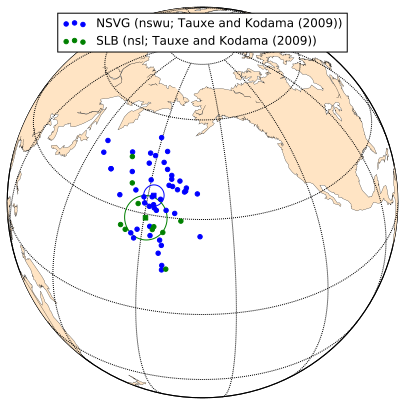

In [5]:
NSVG_nswu = Tauxe_NSVG_Data.ix[Tauxe_NSVG_Data['sequence'] == 'nswu']
NSVG_nswu.reset_index(inplace=True)

NSVG_nswu_VGPs = ipmag.make_di_block(NSVG_nswu['pole_lon'],NSVG_nswu['pole_lat'])
NSVG_nswu_mean = pmag.fisher_mean(NSVG_nswu_VGPs)
ipmag.print_pole_mean(NSVG_nswu_mean)

NSVG_nsl = Tauxe_NSVG_Data.ix[Tauxe_NSVG_Data['sequence'] == 'nsl']
NSVG_nsl.reset_index(inplace=True)
    
NSVG_nsl_VGPs = ipmag.make_di_block(NSVG_nsl['pole_lon'],NSVG_nsl['pole_lat'])
NSVG_nsl_mean = pmag.fisher_mean(NSVG_nsl_VGPs)
ipmag.print_pole_mean(NSVG_nsl_mean)

m = pole_figure_appearance()

ipmag.plot_vgp(m,NSVG_nswu['pole_lon'].tolist(),NSVG_nswu['pole_lat'].tolist(),
               color='b',label='NSVG (nswu; Tauxe and Kodama (2009))')
ipmag.plot_pole(m,NSVG_nswu_mean['dec'],NSVG_nswu_mean['inc'],
                NSVG_nswu_mean['alpha95'], marker='s',color='b')
ipmag.plot_vgp(m,NSVG_nsl['pole_lon'].tolist(),NSVG_nsl['pole_lat'].tolist(),
               color='g',label='SLB (nsl; Tauxe and Kodama (2009))')
ipmag.plot_pole(m,NSVG_nsl_mean['dec'],NSVG_nsl_mean['inc'],
                NSVG_nsl_mean['alpha95'], marker='s',color='g')
plt.legend(loc='upper center')
plt.show()

{'Dec': 180.5436552009686,
 'Inc': 28.803422228130206,
 'Me': 0.65209594384149339,
 'Me_critical': 1.094,
 'Mode': 'Mode 1',
 'Mu': 0.98495553684353243,
 'Mu_critical': 1.207,
 'N': 10,
 'Test_result': 'consistent with Fisherian model'}

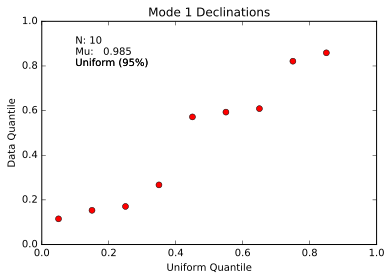

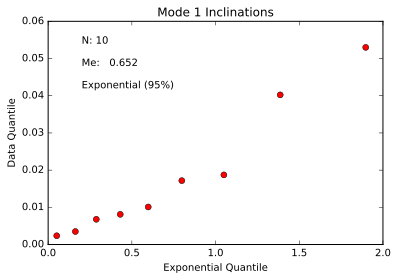

In [6]:
ipmag.fishqq(NSVG_nsl['pole_lon'].tolist(),NSVG_nsl['pole_lat'].tolist())

### New data from Two Island River

We present new paleomagnetic data from 40 Schroeder-Lutsen basalt flows exposed within Two Island River. Magnetizations held by magnetite and those held by hematite or maghemite are virtually identical (see equal area plots below), which suggests oxidation of these lava flows in association with eruption or shortly thereafter.

In [7]:
SLB_Data_all = pd.read_csv('../Data/SLB/pmag_results.txt',sep='\t',skiprows=1)
SLB_Data_all_tc = SLB_Data_all.ix[SLB_Data_all['tilt_correction'] == 100.0]
SLB_Data_hem = SLB_Data_all.ix[SLB_Data_all['pole_comp_name'] == 'hem']
SLB_Data_hem = SLB_Data_hem.ix[SLB_Data_hem['tilt_correction'] == 100.0]
SLB_Data_hem.reset_index
SLB_Data = SLB_Data_all.ix[SLB_Data_all['pole_comp_name'] == 'mag']
SLB_Data = SLB_Data.ix[SLB_Data['tilt_correction'] == 100.0]
SLB_Data.reset_index()
SLB_Data.head()

,average_age,average_age_sigma,average_age_unit,average_alpha95,average_dec,average_height,average_inc,average_k,average_lat,average_lon,...,pmag_criteria_codes,pmag_result_name,pole_comp_name,result_description,tilt_correction,vgp_dm,vgp_dp,vgp_lat,vgp_lon,vgp_n
2,1088.0,3.0,Ma,3.1,270.2,443.0,26.6,285,47.5367,-90.9400,...,ACCEPT,VGP Site: SLB01,mag,"Site VGP, coord system = 100 component: hem",100.0,2.3,4.1,10.5,188.5,9.0
6,1088.0,3.0,Ma,4.0,274.2,443.0,28.1,165,47.5367,-90.9400,...,ACCEPT,VGP Site: SLB02,mag,"Site VGP, coord system = 100 component: hem",100.0,3.1,5.3,13.8,186.3,9.0
10,1088.0,3.0,Ma,3.9,289.5,443.0,51.3,204,47.5344,-90.9350,...,ACCEPT,VGP Site: SLB03,mag,"Site VGP, coord system = 100 component: hem",100.0,4.2,5.1,35.6,189.6,8.0
14,1088.0,3.0,Ma,2.7,292.9,443.0,53.3,427,47.5342,-90.9348,...,ACCEPT,VGP Site: SLB04,mag,"Site VGP, coord system = 100 component: hem",100.0,3.1,3.6,39.0,189.3,8.0
18,1088.0,3.0,Ma,3.8,287.9,443.0,55.2,218,47.5341,-90.9350,...,ACCEPT,VGP Site: SLB05,mag,"Site VGP, coord system = 100 component: hem",100.0,4.5,5.0,36.8,194.3,8.0


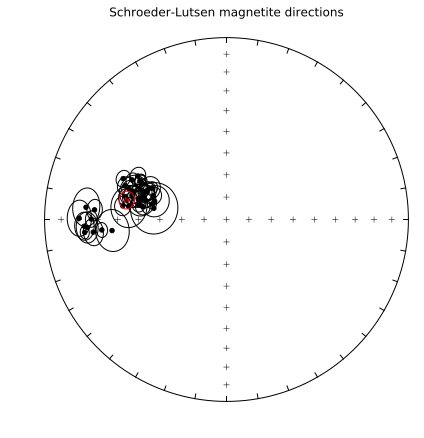

In [8]:
plt.figure(num=1,figsize=(6,6))
ipmag.plot_net(1)

SLB_dec = SLB_Data['average_dec'].tolist()
SLB_inc = SLB_Data['average_inc'].tolist()
SLB_a95 = SLB_Data['average_alpha95'].tolist()

for i in range(len(SLB_dec)):
    ipmag.plot_di_mean(SLB_dec[i], SLB_inc[i], SLB_a95[i])
    
SLB_mean_dir = ipmag.fisher_mean(SLB_dec,SLB_inc)

ipmag.plot_di_mean(SLB_mean_dir['dec'],SLB_mean_dir['inc'],
                   SLB_mean_dir['alpha95'],marker='s', color='r')
plt.title('Schroeder-Lutsen magnetite directions')
    
plt.savefig('Code_output/All_SLB_mag_data.pdf')
plt.show()

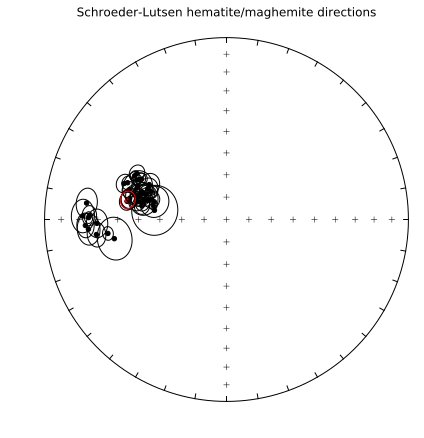

In [9]:
plt.figure(num=1,figsize=(6,6))
ipmag.plot_net(1)

SLB_hem_dec = SLB_Data_hem['average_dec'].tolist()
SLB_hem_inc = SLB_Data_hem['average_inc'].tolist()
SLB_hem_a95 = SLB_Data_hem['average_alpha95'].tolist()

for i in range(len(SLB_hem_dec)):
    ipmag.plot_di_mean(SLB_hem_dec[i], SLB_hem_inc[i], SLB_hem_a95[i])
    
SLB_hem_mean_dir = ipmag.fisher_mean(SLB_hem_dec,SLB_hem_inc)

ipmag.plot_di_mean(SLB_hem_mean_dir['dec'],SLB_hem_mean_dir['inc'],
                   SLB_hem_mean_dir['alpha95'],marker='s', color='r')
plt.title('Schroeder-Lutsen hematite/maghemite directions')

plt.savefig('Code_output/All_SLB_hem_data.pdf')
plt.show()

Below, we calculate the average angular difference between the magnetite and hematite paleomagnetic directions of each sampled flow.

In [10]:
SLB_samples = pd.read_csv('../Data/SLB/pmag_specimens.txt',sep='\t',skiprows=1)
SLB_samples = SLB_samples.ix[SLB_samples['specimen_tilt_correction'] == 100.0]

In [11]:
SLB_mag_hem_diff = []
for sample in SLB_samples.er_specimen_name.unique().tolist():
    try:
        mag_dec = float(SLB_samples.loc[SLB_samples['er_specimen_name']==sample]\
                        .loc[SLB_samples['specimen_comp_name']=='mag'].specimen_dec)
        mag_inc = float(SLB_samples.loc[SLB_samples['er_specimen_name']==sample]\
                        .loc[SLB_samples['specimen_comp_name']=='mag'].specimen_inc)
        hem_dec = float(SLB_samples.loc[SLB_samples['er_specimen_name']==sample]\
                        .loc[SLB_samples['specimen_comp_name']=='hem'].specimen_dec)
        hem_inc = float(SLB_samples.loc[SLB_samples['er_specimen_name']==sample]\
                        .loc[SLB_samples['specimen_comp_name']=='hem'].specimen_inc)
        SLB_mag_hem_diff.append(pmag.angle([mag_dec, mag_inc],[hem_dec, hem_inc]))
    except:
        continue
print 'Average angle between magnetite and hematite/maghemite fits for all samples: ', np.average(np.array(SLB_mag_hem_diff))

Average angle between magnetite and hematite/maghemite fits for all samples:  2.86292160508


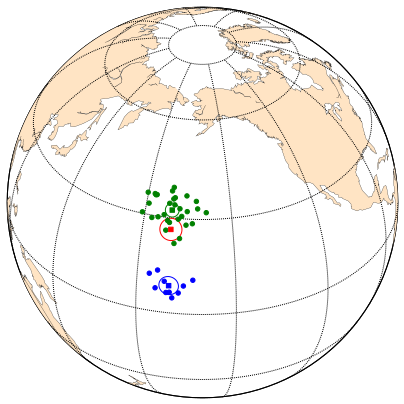

In [12]:
SLB_Data_low_lat = SLB_Data.ix[SLB_Data['vgp_lat'] < 15]
SLB_Data_hi_lat = SLB_Data.ix[SLB_Data['vgp_lat'] >= 15]

new_SLB_mean = ipmag.fisher_mean(SLB_Data['vgp_lon'].tolist(),SLB_Data['vgp_lat'].tolist())
new_SLB_low_lat_mean = ipmag.fisher_mean(SLB_Data_low_lat['vgp_lon'].tolist(),SLB_Data_low_lat['vgp_lat'].tolist())
new_SLB_hi_lat_mean = ipmag.fisher_mean(SLB_Data_hi_lat['vgp_lon'].tolist(),SLB_Data_hi_lat['vgp_lat'].tolist())

m = pole_figure_appearance()

# ipmag.plot_vgp(m,SLB_Data['vgp_lon'].tolist(),SLB_Data['vgp_lat'].tolist(),
#                label='SLB VGPs',color='r')
ipmag.plot_vgp(m,SLB_Data_low_lat['vgp_lon'].tolist(),SLB_Data_low_lat['vgp_lat'].tolist(),
               label='SLB low lat VGPs',color='b')
ipmag.plot_pole(m,new_SLB_low_lat_mean['dec'],new_SLB_low_lat_mean['inc'],new_SLB_low_lat_mean['alpha95'],
                label='SLB low lat mean',marker='s',color='b')
ipmag.plot_vgp(m,SLB_Data_hi_lat['vgp_lon'].tolist(),SLB_Data_hi_lat['vgp_lat'].tolist(),
               label='SLB high lat VGPs',color='g')
ipmag.plot_pole(m,new_SLB_hi_lat_mean['dec'],new_SLB_hi_lat_mean['inc'],new_SLB_hi_lat_mean['alpha95'],
                label='SLB high lat mean',marker='s',color='g')
ipmag.plot_pole(m,new_SLB_mean['dec'],new_SLB_mean['inc'],new_SLB_mean['alpha95'],
                label='All SLB mean',marker='s',color='red')

As is apparent in the plots above, SLB paleomagnetic directions fall into two distinct populations. We organize these into lower and higher latitude poles below.

In [13]:
SLB_Data_low_lat.head()

,average_age,average_age_sigma,average_age_unit,average_alpha95,average_dec,average_height,average_inc,average_k,average_lat,average_lon,...,pmag_criteria_codes,pmag_result_name,pole_comp_name,result_description,tilt_correction,vgp_dm,vgp_dp,vgp_lat,vgp_lon,vgp_n
2,1088.0,3.0,Ma,3.1,270.2,443.0,26.6,285,47.5367,-90.9400,...,ACCEPT,VGP Site: SLB01,mag,"Site VGP, coord system = 100 component: hem",100.0,2.3,4.1,10.5,188.5,9.0
6,1088.0,3.0,Ma,4.0,274.2,443.0,28.1,165,47.5367,-90.9400,...,ACCEPT,VGP Site: SLB02,mag,"Site VGP, coord system = 100 component: hem",100.0,3.1,5.3,13.8,186.3,9.0
38,1088.0,3.0,Ma,5.2,264.6,443.0,27.3,98,47.5325,-90.9334,...,ACCEPT,VGP Site: SLB10,mag,"Site VGP, coord system = 100 component: hem",100.0,4.0,6.8,7.1,192.8,9.0
42,1088.0,3.0,Ma,8.4,264.5,443.0,36.9,39,47.5322,-90.9335,...,ACCEPT,VGP Site: SLB11,mag,"Site VGP, coord system = 100 component: hem",100.0,7.1,11.1,11.5,197.1,9.0
46,1088.0,3.0,Ma,2.9,265.2,443.0,31.8,324,47.5322,-90.9335,...,ACCEPT,VGP Site: SLB12,mag,"Site VGP, coord system = 100 component: hem",100.0,2.3,3.8,9.5,194.3,9.0


In [14]:
SLB_Data_hi_lat.head()

,average_age,average_age_sigma,average_age_unit,average_alpha95,average_dec,average_height,average_inc,average_k,average_lat,average_lon,...,pmag_criteria_codes,pmag_result_name,pole_comp_name,result_description,tilt_correction,vgp_dm,vgp_dp,vgp_lat,vgp_lon,vgp_n
10,1088.0,3.0,Ma,3.9,289.5,443.0,51.3,204,47.5344,-90.9350,...,ACCEPT,VGP Site: SLB03,mag,"Site VGP, coord system = 100 component: hem",100.0,4.2,5.1,35.6,189.6,8.0
14,1088.0,3.0,Ma,2.7,292.9,443.0,53.3,427,47.5342,-90.9348,...,ACCEPT,VGP Site: SLB04,mag,"Site VGP, coord system = 100 component: hem",100.0,3.1,3.6,39.0,189.3,8.0
18,1088.0,3.0,Ma,3.8,287.9,443.0,55.2,218,47.5341,-90.9350,...,ACCEPT,VGP Site: SLB05,mag,"Site VGP, coord system = 100 component: hem",100.0,4.5,5.0,36.8,194.3,8.0
22,1088.0,3.0,Ma,2.8,283.2,443.0,52.6,337,47.5344,-90.9351,...,ACCEPT,VGP Site: SLB06,mag,"Site VGP, coord system = 100 component: hem",100.0,3.1,3.7,32.2,194.7,9.0
26,1088.0,3.0,Ma,6.7,284.3,443.0,56.5,60,47.5337,-90.9344,...,ACCEPT,VGP Site: SLB07,mag,"Site VGP, coord system = 100 component: hem",100.0,8.2,8.8,35.3,197.8,9.0


{'Dec': 189.55557939703078,
 'Inc': 26.745255032788066,
 'Me': 0.53371584170306374,
 'Me_critical': 1.094,
 'Mode': 'Mode 1',
 'Mu': 1.7737870824702469,
 'Mu_critical': 1.207,
 'N': 40,
 'Test_result': 'Fisherian model rejected'}

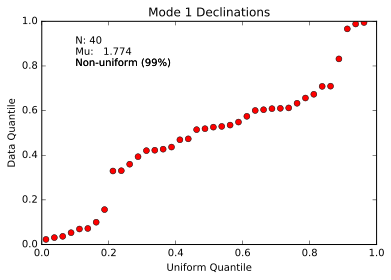

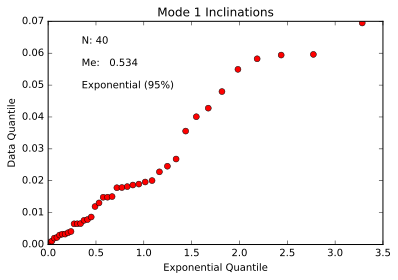

In [15]:
# Test whether new SLB data qualifies as a Fisherian distribution
ipmag.fishqq(SLB_Data['vgp_lon'].tolist(),SLB_Data['vgp_lat'].tolist())

When the two populations are grouped, the combined SLB data fail the Fisher quantile-quantile test above. Possible explanations for this non-Fisherian distribution are explored below.
### VGP populations from new SLB data
#### *Rapid multiple-eruption episodes that are causing excursional behavior to be overrepresented in the dataset*
This explanation would likely predict that the more southerly VGPs are excursional and therefore stratigraphically grouped. However, approaching the problem from a stratigraphic standpoint reveals that the low latitude VGPs are encountered in multiple parts of the stratigraphic succession. Since these VGPS are coming from flows throughout SLB stratigraphy (some sequential flows, others isolated) if the southerly population is excursional it would have needed to be a direction that was returned to repeatedly by the field.
In the stratigraphic column below, the blue arrows mark sampled flows that exhibit low latitude directions, and the red arrows mark sampled flows that exhibit high latitude directions. It is quite clear from this figure that there is no stratigraphic pattern of the anomalous paleomagnetic directions.
![SLB_strat](../data/SLB/plots/SLB_strat.pdf)
Additionally, a broader map view of the stack of lava flows highlights the discontinuity of the two VGP populations.
![SLB_mapbyVGP](../data/SLB/plots/SLB_shadedbyVGPlat.png)

#### *Rock magnetism*
A difference in the magnetic mineralogy of certain flows could indicate a chemical remagnetization representing the local geomagnetic field at a later date leading to the more southerly VGPs. However, the specimens in the two VGP populations encompass the same range of demagnetization behaviors. Therefore a rock magnetic explanation for the divergent directions is not readily apparent within the data. The demagnetization data (averaged by flow) of both high and low latitude VGPs are presented below.

In [16]:
high_lat_sites = SLB_Data_hi_lat.er_site_names.tolist()
low_lat_sites = SLB_Data_low_lat.er_site_names.tolist()

8204  records read from  ../Data/SLB/magic_measurements.txt
SLB01 plotting by:  er_site_name
SLB02 plotting by:  er_site_name
SLB10 plotting by:  er_site_name
SLB11 plotting by:  er_site_name
SLB12 plotting by:  er_site_name
SLB13 plotting by:  er_site_name
SLB14 plotting by:  er_site_name
SLB15 plotting by:  er_site_name
SLB16 plotting by:  er_site_name
SLB29 plotting by:  er_site_name


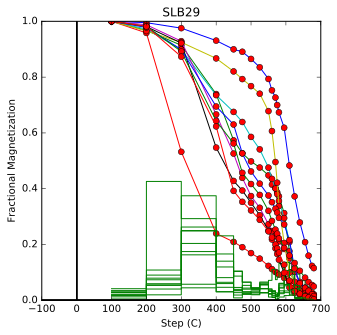

In [17]:
ipmag.demag_magic('../Data/SLB/', plot_by='site', treat='T', 
                  individual=low_lat_sites,average_measurements=True, 
                  single_plot=True)

8204  records read from  ../Data/SLB/magic_measurements.txt
SLB03 plotting by:  er_site_name
SLB04 plotting by:  er_site_name
SLB05 plotting by:  er_site_name
SLB06 plotting by:  er_site_name
SLB07 plotting by:  er_site_name
SLB08 plotting by:  er_site_name
SLB09 plotting by:  er_site_name
SLB17 plotting by:  er_site_name
SLB18 plotting by:  er_site_name
SLB19 plotting by:  er_site_name
SLB20 plotting by:  er_site_name
SLB21 plotting by:  er_site_name
SLB22 plotting by:  er_site_name
SLB23 plotting by:  er_site_name
SLB24 plotting by:  er_site_name
SLB25 plotting by:  er_site_name
SLB26 plotting by:  er_site_name
SLB27 plotting by:  er_site_name
SLB28 plotting by:  er_site_name
SLB30 plotting by:  er_site_name
SLB31 plotting by:  er_site_name
SLB32 plotting by:  er_site_name
SLB33 plotting by:  er_site_name
SLB34 plotting by:  er_site_name
SLB35 plotting by:  er_site_name
SLB36 plotting by:  er_site_name
SLB37 plotting by:  er_site_name
SLB38 plotting by:  er_site_name
SLB39 plotting b

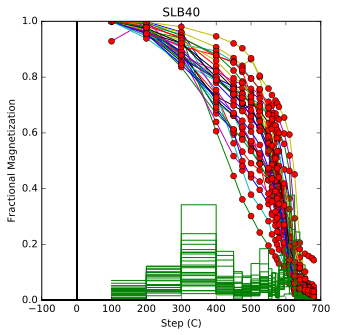

In [18]:
ipmag.demag_magic('../Data/SLB/', plot_by='site', treat='T', 
                  individual=high_lat_sites, average_measurements=True, 
                  single_plot=True)

#### *Patterns in the distribution and/or secular variation of poles*
Considered individually, both VGP populations are Fisher-distributed.

{'Dec': 189.87618031371633,
 'Inc': 9.225749891843499,
 'Me': 0.77027561013556023,
 'Me_critical': 1.094,
 'Mode': 'Mode 1',
 'Mu': 0.93893808899861431,
 'Mu_critical': 1.207,
 'N': 10,
 'Test_result': 'consistent with Fisherian model'}

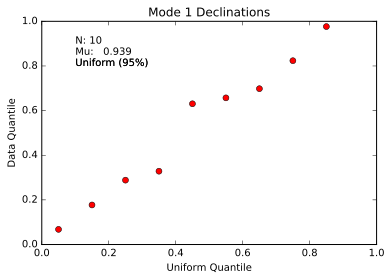

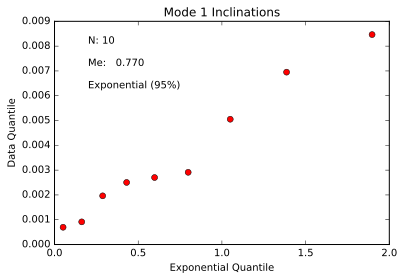

In [19]:
ipmag.fishqq(SLB_Data_low_lat['vgp_lon'].tolist(),SLB_Data_low_lat['vgp_lat'].tolist())

{'Dec': 189.43399983176758,
 'Inc': 32.306644938683029,
 'Me': 1.1071268307909761,
 'Me_critical': 1.094,
 'Mode': 'Mode 1',
 'Mu': 0.60645097771482315,
 'Mu_critical': 1.207,
 'N': 30,
 'Test_result': 'Fisherian model rejected'}

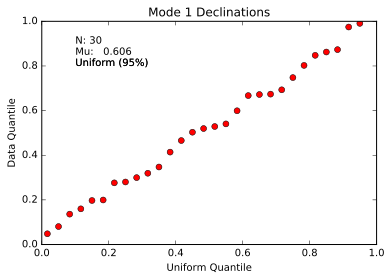

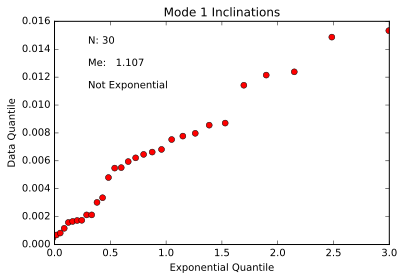

In [20]:
ipmag.fishqq(SLB_Data_hi_lat['vgp_lon'].tolist(),SLB_Data_hi_lat['vgp_lat'].tolist())

One last way to approach this problem is to inspect the path of the paleomagnetic poles being traced out by secular variation. We can look for potential patterns in the path of the poles through time by considering each cooling unit's stratigraphic placement. 

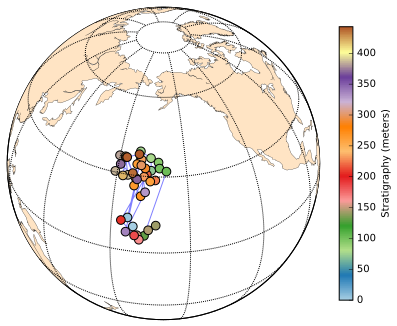

In [21]:
# upload strat heights
SLB_strat_df = pd.read_csv('../Data/SLB/er_sites.txt', sep='\t', skiprows=1, 
                           usecols=['er_site_name', 'site_height'])
SLB_strat_df = SLB_strat_df.set_index('er_site_name')

m = pole_figure_appearance()

centerlon, centerlat = m(SLB_Data['vgp_lon'].tolist(),SLB_Data['vgp_lat'].tolist())
m.plot(centerlon, centerlat, alpha=0.5, zorder=1)
m.scatter(centerlon, centerlat, marker='.', s=300.0, c = SLB_strat_df.site_height.tolist(), cmap='Paired', zorder=2)

plt.colorbar(label='Stratigraphy (meters)', shrink=0.7)
plt.show()

From this view, we notice the relatively tight grouping of poles among certain stratigraphic intervals as they trace out sections of the entire distribution. However, there is still no apparent explanation for the occasional excursion of the geomagnetic pole to lower latitudes. It therefore seems likely that the divergence of these two VGP populations can be attributed to a recurrent geomagnetic excursion rather than a post-emplacement offset of magnetizations. We also note the similarity of this anomalous behavior to the distribution of paleomagnetic poles from the Lake Shore Traps (see below).

## Combine new SLB data with Tauxe and Kodama (2009)

In [22]:
combined_SLB_lon = NSVG_nsl['pole_lon'].tolist() + SLB_Data['vgp_lon'].tolist()
combined_SLB_lat = NSVG_nsl['pole_lat'].tolist() + SLB_Data['vgp_lat'].tolist()
combined_SLB_mean = ipmag.fisher_mean(combined_SLB_lon,combined_SLB_lat)

Plong: 187.8  Plat: 27.1
Number of directions in mean (n): 50
Angular radius of 95% confidence (A_95): 3.0
Precision parameter (k) estimate: 46.5


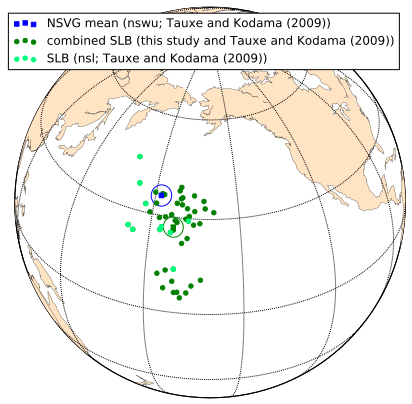

In [23]:
m = pole_figure_appearance()

# ipmag.plot_vgp(m,NSVG_nswu['pole_lon'].tolist(),NSVG_nswu['pole_lat'].tolist(),
#                color='b',label='NSVG (nswu; Tauxe and Kodama (2009))')
ipmag.plot_pole(m,NSVG_nswu_mean['dec'],NSVG_nswu_mean['inc'],
                NSVG_nswu_mean['alpha95'], marker='s',color='b',
                label='NSVG mean (nswu; Tauxe and Kodama (2009))')
ipmag.plot_vgp(m,combined_SLB_lon,combined_SLB_lat, color='g',
               label='combined SLB (this study and Tauxe and Kodama (2009))')
ipmag.plot_vgp(m,NSVG_nsl['pole_lon'].tolist(),NSVG_nsl['pole_lat'].tolist(),
               color='springgreen',label='SLB (nsl; Tauxe and Kodama (2009))')
ipmag.plot_pole(m,combined_SLB_mean['dec'],combined_SLB_mean['inc'],
                combined_SLB_mean['alpha95'], marker='s',color='g')

ipmag.print_pole_mean(combined_SLB_mean)

plt.legend()
plt.savefig('./Code_output/NSVG_SLB_poles_combined.pdf')
plt.show()

{'Dec': 187.79191234206988,
 'Inc': 27.199685356762615,
 'Me': 0.53556909069644332,
 'Me_critical': 1.094,
 'Mode': 'Mode 1',
 'Mu': 1.4805683534761531,
 'Mu_critical': 1.207,
 'N': 50,
 'Test_result': 'Fisherian model rejected'}

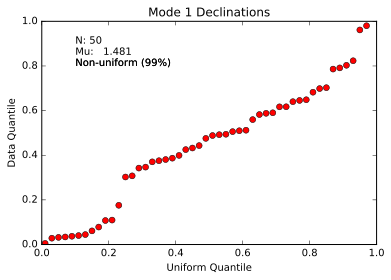

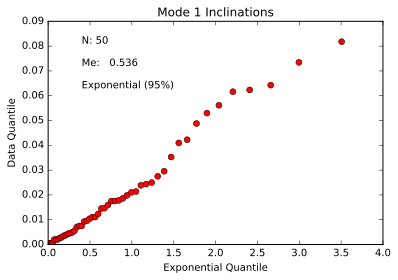

In [24]:
ipmag.fishqq(combined_SLB_lon,combined_SLB_lat)

## Lake Shore Traps

In [25]:
Diehl1994a_LST_Data_all=pd.read_csv('../Data/Previous_studies/Diehl1994a_data.csv',sep=',')
#Kulakov2013 reported data for the flow LST28 that supersedes 
#the Diehl direction which should accordingly be dropped
Diehl1994a_LST_Data=Diehl1994a_LST_Data_all.drop(17)
Diehl1994a_LST_Data.reset_index(inplace=True)
Diehl1994a_LST_Data.head()

,index,site_ID,study,dec_is,inc_is,dip_direction,dip,dec_tc,inc_tc,a_95,n,site_lat,site_lon,vgp_lat,vgp_lon,kappa,member,location
0,0,LST1,Diehl1994a,281.8,38.5,22,24,301.3,38.7,3.8,9,47.43,-87.71,36.9,174.8,184.7,Middle LST,Eastern sites
1,1,LST2,Diehl1994a,283.5,38.0,22,24,302.5,37.6,4.8,7,47.43,-87.71,37.1,173.2,162.8,Middle LST,Eastern sites
2,2,LST3,Diehl1994a,284.1,37.3,22,24,302.5,36.7,2.4,7,47.43,-87.71,36.7,172.6,620.2,Middle LST,Eastern sites
3,3,LST4,Diehl1994a,281.9,36.4,22,24,300.1,36.8,2.1,8,47.43,-87.71,35.2,174.6,681.1,Middle LST,Eastern sites
4,4,LST5,Diehl1994a,284.8,35.4,22,24,302.0,34.8,2.4,7,47.43,-87.71,35.5,171.9,630.0,Middle LST,Eastern sites


In [26]:
Kulakov2013a_LST_Data=pd.read_csv('../Data/Previous_studies/Kulakov2013a_data.csv',sep=',')
Kulakov2013a_LST_Data.head()

,site_ID,study,dec_is,inc_is,dip_direction,dip,dec_tc,inc_tc,a_95,directional_kappa,n,site_lat,site_lon,vgp_lat,vgp_lon,member,location
0,CS1,Kulakov2013a,267.9,46.8,356,38,300.3,34.1,3.8,240,9,47.46,-88.07,34.0,172.5,Middle LST,Coast near Silver Island
1,CS2,Kulakov2013a,261.1,47.2,356,38,297.0,37.9,2.7,803,6,47.46,-88.07,33.6,177.4,Middle LST,Coast near Silver Island
2,SI1,Kulakov2013a,239.2,43.5,356,38,280.4,48.1,3.0,185,9,47.46,-88.07,27.7,195.8,Middle LST,Silver Island
3,SI2,Kulakov2013a,237.2,37.8,356,38,272.4,45.8,5.0,163,6,47.46,-88.07,21.2,199.5,Middle LST,Silver Island
4,SI3,Kulakov2013a,243.9,40.5,356,38,279.9,43.5,4.0,620,6,47.46,-88.07,24.9,193.1,Middle LST,Silver Island


In [27]:
LST_Diehl_VGPs=ipmag.make_di_block(Diehl1994a_LST_Data['vgp_lon'],
                                   Diehl1994a_LST_Data['vgp_lat'])

LST_Kulakov_VGPs=ipmag.make_di_block(Kulakov2013a_LST_Data['vgp_lon'],
                                     Kulakov2013a_LST_Data['vgp_lat'])

LST_VGPs=np.concatenate((LST_Diehl_VGPs,LST_Kulakov_VGPs))

LST_Diehl_mean = pmag.fisher_mean(LST_Diehl_VGPs)
LST_Kulakov_mean=pmag.fisher_mean(LST_Kulakov_VGPs)
LST_all_mean=pmag.fisher_mean(LST_VGPs)

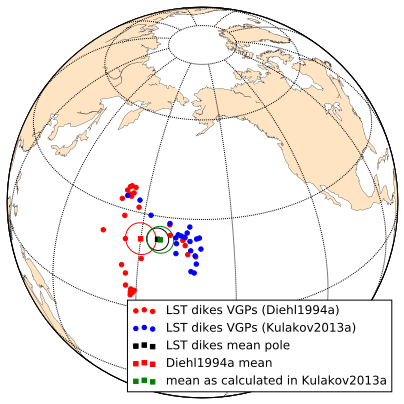

In [28]:
m = Basemap(projection='ortho',lat_0=35,lon_0=200,resolution='c',
            area_thresh=50000)
pole_figure_appearance()

ipmag.plot_vgp(m,Diehl1994a_LST_Data['vgp_lon'].tolist(),
               Diehl1994a_LST_Data['vgp_lat'].tolist(),
              label='LST dikes VGPs (Diehl1994a)',color='r')
ipmag.plot_vgp(m,Kulakov2013a_LST_Data['vgp_lon'].tolist(),
               Kulakov2013a_LST_Data['vgp_lat'].tolist(),
              label='LST dikes VGPs (Kulakov2013a)',color='b')
ipmag.plot_pole(m,LST_all_mean['dec'],LST_all_mean['inc'],
                LST_all_mean['alpha95'], label='LST dikes mean pole',marker='s')
ipmag.plot_pole(m,LST_Diehl_mean['dec'],LST_Diehl_mean['inc'],
                LST_Diehl_mean['alpha95'], color='r',
                label='Diehl1994a mean',marker='s')
#from Kulakov2013a
ipmag.plot_pole(m,186.4,23.1,4.0,color='g',
                label='mean as calculated in Kulakov2013a',marker='s')

plt.legend(loc=4)
plt.savefig('Code_output/LST_vgps.pdf')
plt.show()

Here we test whether the distribution of Lake Shore Traps VGPs are Fisherian. 

{'Dec': 185.61848690207148,
 'Inc': 23.207239038463833,
 'Me': 1.1080580586218494,
 'Me_critical': 1.094,
 'Mode': 'Mode 1',
 'Mu': 1.8795789739707827,
 'Mu_critical': 1.207,
 'N': 49,
 'Test_result': 'Fisherian model rejected'}

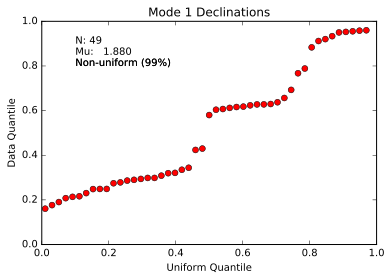

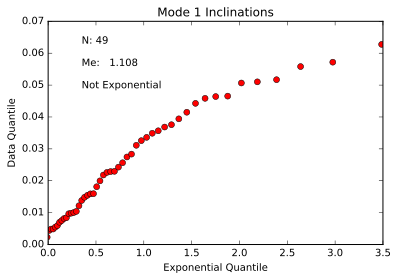

In [29]:
ipmag.fishqq(di_block=LST_VGPs)

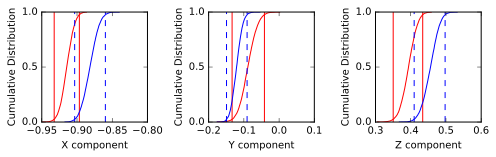

In [30]:
ipmag.common_mean_bootstrap(LST_VGPs,ipmag.make_di_block(combined_SLB_lon,
                                                         combined_SLB_lat))

Results of Watson V test: 

Watson's V:           6.0
Critical value of V:  6.3
"Pass": Since V is less than Vcrit, the null hypothesis
that the two populations are drawn from distributions
that share a common mean direction can not be rejected.

M&M1990 classification:

Angle between data set means: 4.4
Critical angle for M&M1990:   4.5
The McFadden and McElhinny (1990) classification for
this test is: 'A'


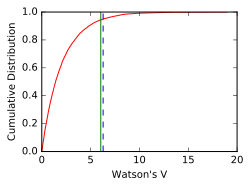

In [31]:
ipmag.common_mean_watson(LST_VGPs,
                         ipmag.make_di_block(combined_SLB_lon,combined_SLB_lat), 
                         plot='yes')

## Michipicoten Island

### Palmer and Davis (1987) data

In [32]:
Palmer1987_data=pd.read_csv('../Data/Previous_studies/Palmer1987a_data_combined_sites.csv')
ipmag.vgp_calc(Palmer1987_data)

The code below splits this dataframe into sites from older main stage basalts that have been correlated to the Mamainse Point Formation, sites from the instrusive suite, and sites from the Michipicoten Island Formation.

While not explicitly described as such, it appears that each of the sites sampled in Palmer and Davis (1987) are treated as single cooling units except for site 'KM' which is decribed as being collected over a stratigraphic interval containing multiple flows. As the site is not from a single cooling unit, data from this are excluded. Also, site 18 is described as coming from a fault bound block with anomalous steep dip where a structural attitude could not be determined and should be excluded.

Palmer and Davis (1987) sampled the Channel Lake Member, the Cuesta Member, and the Davieaux Island Member at multiple sites from which VGPs were found and used in the final calculation of the Michipicoten Island Formation mean paleomagnetic pole. However, field observations reveal that some of these sites represented the redundant sampling of a single cooling unit, meaning that several VGPs that were originally treated as independent should have been combined with one another in the final calculation. Here we reduce the Palmer and Davis (1987) data set to satisfy these concerns. The reduced number of sites for each Michipicoten Island Formation member is shown below.

In [33]:
print 'Number of Cuesta Member flows: ', len(Palmer1987_data.loc[Palmer1987_data['member']=='Cuesta_Member'])
print 'Number of Channel Lake Member flows: ', len(Palmer1987_data.loc[Palmer1987_data['member']=='Channel_Lake_Member'])
print 'Number of Quebec Harbour Member flows: ', len(Palmer1987_data.loc[Palmer1987_data['member']=='Quebec_Harbour_Member'])
print 'Number of South Shore Member flows: ', len(Palmer1987_data.loc[Palmer1987_data['member']=='South_Shore_Member'])
print 'Number of Davieaux Island Member flows: ', len(Palmer1987_data.loc[Palmer1987_data['member']=='Davieaux_Island_Member'])
print 'Total number of cooling units from the Michipicoten Island Formation: ',len(Palmer1987_data.loc[Palmer1987_data['formation']=='Michipicoten_Island'])

Number of Cuesta Member flows:  2
Number of Channel Lake Member flows:  1
Number of Quebec Harbour Member flows:  1
Number of South Shore Member flows:  3
Number of Davieaux Island Member flows:  1
Total number of cooling units from the Michipicoten Island Formation:  8


Michipicoten Island Mamainse Formation mean:
Plong: 185.6  Plat: 36.9
Number of directions in mean (n): 7
Angular radius of 95% confidence (A_95): 13.4
Precision parameter (k) estimate: 21.2

Michipicoten Island instrusions mean:
Plong: 165.7  Plat: 23.9
Number of directions in mean (n): 3
Angular radius of 95% confidence (A_95): 22.5
Precision parameter (k) estimate: 31.2

Michipicoten Island Formation mean:
Plong: 174.9  Plat: 25.5
Number of directions in mean (n): 8
Angular radius of 95% confidence (A_95): 7.7
Precision parameter (k) estimate: 53.2


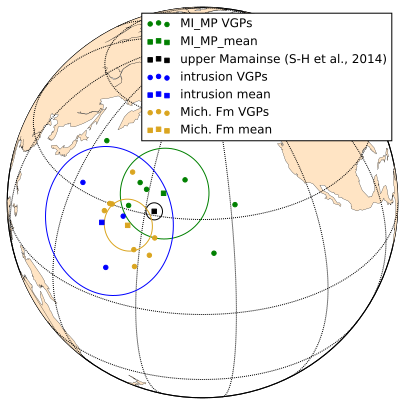

In [34]:
MI_Mamainse_Fm=Palmer1987_data.ix[Palmer1987_data['formation'] == 'Quebec_Mine']
MI_Mamainse_Fm.reset_index(inplace=True, drop=True)
#make dataframe that excludes sites 18 and KM and reset the index of the dataframe
#MI_Mamainse_Fm=MI_Mamainse_Fm_all.drop([1,8])
MI_Mamainse_Fm.reset_index(inplace=True)
MI_Mamainse_Fm_VGPs = ipmag.make_di_block(MI_Mamainse_Fm['vgp_lon'],MI_Mamainse_Fm['vgp_lat'])
MI_Mamainse_Fm_mean = pmag.fisher_mean(MI_Mamainse_Fm_VGPs)
print 'Michipicoten Island Mamainse Formation mean:'
ipmag.print_pole_mean(MI_Mamainse_Fm_mean)

MI_intrusions=Palmer1987_data.ix[Palmer1987_data['formation'] == 'intrusive']
MI_intrusions.reset_index(inplace=True, drop=True)
MI_intrusions_VGPs = ipmag.make_di_block(MI_intrusions['vgp_lon'],MI_intrusions['vgp_lat'])
MI_intrusions_mean = pmag.fisher_mean(MI_intrusions_VGPs)
print '\nMichipicoten Island instrusions mean:'
ipmag.print_pole_mean(MI_intrusions_mean)

Michipicoten_Island_Fm=Palmer1987_data.ix[Palmer1987_data['formation'] == 'Michipicoten_Island']
Michipicoten_Island_Fm.reset_index(inplace=True, drop=True)
Michipicoten_Island_Fm_VGPs = ipmag.make_di_block(Michipicoten_Island_Fm['vgp_lon'],Michipicoten_Island_Fm['vgp_lat'])
Michipicoten_Island_Fm_mean = pmag.fisher_mean(Michipicoten_Island_Fm_VGPs)
print '\nMichipicoten Island Formation mean:'
ipmag.print_pole_mean(Michipicoten_Island_Fm_mean)

m = pole_figure_appearance()

ipmag.plot_vgp(m,MI_Mamainse_Fm['vgp_lon'].tolist(),MI_Mamainse_Fm['vgp_lat'].tolist(),
               label='MI_MP VGPs',color='g')
ipmag.plot_pole(m,MI_Mamainse_Fm_mean['dec'],MI_Mamainse_Fm_mean['inc'],MI_Mamainse_Fm_mean['alpha95'],
                label='MI_MP_mean',marker='s',color='g')
ipmag.plot_pole(m,183.2,31.2,2.5,label='upper Mamainse (S-H et al., 2014)',marker='s')

ipmag.plot_vgp(m,MI_intrusions['vgp_lon'].tolist(),MI_intrusions['vgp_lat'].tolist(),
               label='intrusion VGPs',color='blue')
ipmag.plot_pole(m,MI_intrusions_mean['dec'],MI_intrusions_mean['inc'],MI_intrusions_mean['alpha95'],
                label='intrusion mean',marker='s',color='blue')

ipmag.plot_vgp(m,Michipicoten_Island_Fm['vgp_lon'].tolist(),
               Michipicoten_Island_Fm['vgp_lat'].tolist(),
               label='Mich. Fm VGPs',color='goldenrod')
ipmag.plot_pole(m,Michipicoten_Island_Fm_mean['dec'],Michipicoten_Island_Fm_mean['inc'],
                Michipicoten_Island_Fm_mean['alpha95'],
                label='Mich. Fm mean',marker='s',color='goldenrod')
plt.legend()
plt.show()

In [35]:
Michipicoten_Island_Fm

,study,site,dec_tc,inc_tc,a95,n,site_lat,site_lon,formation,member,site_R,site_kappa,comment,paleolatitude,vgp_lat,vgp_lon,vgp_lat_rev,vgp_lon_rev
0,Palmer1987,1 and 24,302.000000,23.000000,16.000000,11,47.72,-85.95,Michipicoten_Island,Cuesta_Member,1.990000,229.000000,Fisher mean of site means 1 and 24---same flow...,11.982503,30.155157,167.669185,-30.155157,347.669185
1,Palmer1987,11 and 12,302.764894,21.588111,5.200000,8,47.73,-85.62,Michipicoten_Island,Cuesta_Member,1.813883,5.372968,Fisher mean of site means 11 and 12,11.191105,30.047371,166.739747,-30.047371,346.739747
2,Palmer1987,"3, 13, and 25",301.683851,17.014168,29.850000,13,47.71,-85.94,Michipicoten_Island,Channel_Lake_Member,1.927198,13.735912,"Fisher mean of site means 3, 13 and 25---Chann...",8.698827,27.466789,165.507882,-27.466789,345.507882
3,Palmer1987,2 and 4,307.244661,39.086265,23.000000,9,47.71,-85.94,Michipicoten_Island,Quebec_Harbour_Member,1.991427,116.655000,Fisher mean of site means 2 and 4,22.104038,40.970516,171.701143,-40.970516,351.701143
4,Palmer1987,14,283.000000,24.000000,5.600000,5,47.73,-85.64,Michipicoten_Island,South_Shore_Member,4.979000,188.000000,NaN,12.550216,17.968086,183.376675,-17.968086,3.376675
5,Palmer1987,5,286.000000,32.000000,5.100000,5,47.70,-85.85,Michipicoten_Island,South_Shore_Member,4.982000,224.000000,NaN,17.350615,23.430590,184.531613,-23.430590,4.531613
6,Palmer1987,16,283.000000,13.000000,11.200000,4,47.71,-85.79,Michipicoten_Island,South_Shore_Member,3.956000,68.000000,NaN,6.584742,13.603190,179.006565,-13.603190,359.006565
7,Palmer1987,15 and 17,287.078283,19.133917,21.831841,9,47.70,-85.79,Michipicoten_Island,Davieaux_Island_Member,1.992479,132.958280,Fisher mean of site means 15 and 17,9.841281,18.732965,178.210301,-18.732965,358.210301


### New data from the Michipicoten Island Formation

New paleomagnetic data from the Michipicoten Island Formation are imported below. We first separate data by *in situ* ("geo") and tilt-corrected ("tc") coordinates. We then further separate data by member ("SS" = South Shore Member basalts, "CM" = Cuesta Member andesite).

In [36]:
All_Michi = pd.read_csv('../Data/Michipicoten/pmag_results.txt',
                        sep='\t',skiprows=1)
All_Michi_geo = All_Michi.ix[All_Michi['pole_comp_name'] == 'HT']\
.ix[All_Michi['tilt_correction']==0]
All_Michi_tc = All_Michi.ix[All_Michi['pole_comp_name'] == 'HT']\
.ix[All_Michi['tilt_correction']==100]
All_Michi_tc.reset_index(inplace=True, drop=True)
All_Michi_geo.reset_index(inplace=True, drop=True)

In [37]:
SS_final = All_Michi.ix[All_Michi['er_site_names'].str.startswith('SS')]
SS_final_tc = All_Michi_tc.ix[All_Michi_tc['er_site_names'].str.startswith('SS')]
SS_final_geo = All_Michi_geo.ix[All_Michi_geo['er_site_names'].str.startswith('SS')]
SS_final_tc.head()

,average_age,average_age_sigma,average_age_unit,average_alpha95,average_dec,average_inc,average_k,average_lat,average_lon,average_n,...,pmag_criteria_codes,pmag_result_name,pole_comp_name,result_description,tilt_correction,vgp_dm,vgp_dp,vgp_lat,vgp_lon,vgp_n
2,1083.5,0.5,Ma,3.8,273.0,0.6,219.0,47.7239,-85.6483,8,...,ACCEPT,VGP Site: SS1,HT,"Site VGP, coord system = 100 component: LT",100,2.6,5.0,2.2,182.3,8
3,1083.5,0.5,Ma,3.6,296.4,-2.5,239.0,47.7233,-85.6489,8,...,ACCEPT,VGP Site: SS10,HT,"Site VGP, coord system = 100 component: LT",100,2.4,4.8,16.4,163.4,8
4,1083.5,0.5,Ma,3.1,297.2,-0.7,312.0,47.7238,-85.6495,8,...,ACCEPT,VGP Site: SS11,HT,"Site VGP, coord system = 100 component: LT",100,2.1,4.1,17.6,163.3,8
5,1083.5,0.5,Ma,12.4,291.9,9.3,18.0,47.7244,-85.6506,9,...,ACCEPT,VGP Site: SS12,HT,"Site VGP, coord system = 100 component: LT",100,8.5,16.4,18.1,171.0,9
6,1083.5,0.5,Ma,8.5,302.0,21.3,51.0,47.7242,-85.6508,7,...,ACCEPT,VGP Site: SS13,HT,"Site VGP, coord system = 100 component: LT",100,6.1,11.2,29.4,167.2,7


In [38]:
CM_final_tc = All_Michi_tc.ix[All_Michi_tc['er_site_names'].str.startswith('CM')]
CM_final_tc

,average_age,average_age_sigma,average_age_unit,average_alpha95,average_dec,average_inc,average_k,average_lat,average_lon,average_n,...,pmag_criteria_codes,pmag_result_name,pole_comp_name,result_description,tilt_correction,vgp_dm,vgp_dp,vgp_lat,vgp_lon,vgp_n
0,1083.5,0.5,Ma,6.6,323.8,21.0,71.0,47.723,-85.9522,8,...,ACCEPT,VGP Site: CM1,HT,"Site VGP, coord system = 100 component: LT",100,4.8,8.7,42.3,145.7,8
1,1083.5,0.5,Ma,1.6,303.8,6.1,1035.0,47.719,-85.9559,9,...,ACCEPT,VGP Site: CM2,HT,"Site VGP, coord system = 100 component: LT",100,1.1,2.1,24.4,159.7,9


Paleomagnetic site means of the South Shore basalts are plotted below with the overall mean.

Dec: 287.6  Inc: 10.4
Number of directions in mean (n): 21
Angular radius of 95% confidence (a_95): 5.4
Precision parameter (k) estimate: 35.4


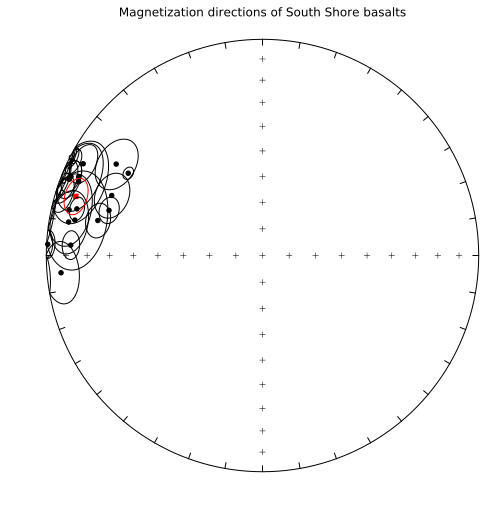

In [39]:
plt.figure(num=1,figsize=(7,7))
ipmag.plot_net(1)

SS_dec = SS_final_tc['average_dec'].tolist()
SS_inc = SS_final_tc['average_inc'].tolist()
SS_a95 = SS_final_tc['average_alpha95'].tolist()

for i in range(len(SS_dec)):
    ipmag.plot_di_mean(SS_dec[i], SS_inc[i], SS_a95[i])

SS_mean_dir = ipmag.fisher_mean(SS_dec,SS_inc)

ipmag.plot_di_mean(SS_mean_dir['dec'],SS_mean_dir['inc'],
                   SS_mean_dir['alpha95'],marker='s', color='r')
ipmag.print_direction_mean(SS_mean_dir)
plt.savefig('Code_output/All_SS_data.pdf')
plt.title('Magnetization directions of South Shore basalts')
plt.clabel
plt.show()

A Fisher Q-Q test reveals these data to be consistent with the Fisherian model.

{'Dec': 287.60360855657012,
 'Inc': 10.297033320865525,
 'Me': 0.92123018046225358,
 'Me_critical': 1.094,
 'Mode': 'Mode 1',
 'Mu': 0.92607542329666181,
 'Mu_critical': 1.207,
 'N': 21,
 'Test_result': 'consistent with Fisherian model'}

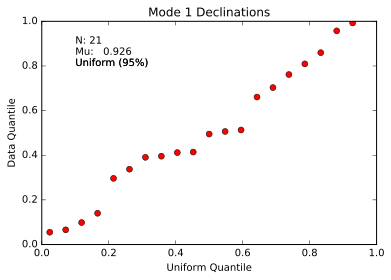

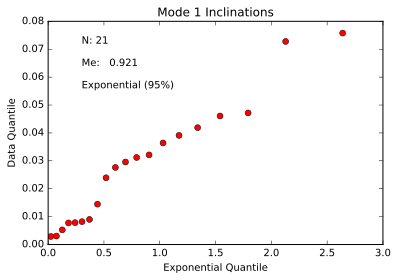

In [40]:
ipmag.fishqq(SS_dec, SS_inc)

The bedding is similar through the South Shore Member such that a fold test is inconclusive (see below). A more complete treatment of our structural analysis of the Michipicoten Island lava flows, including a walkthrough of how we determined tilt-correction for different stratigraphic sections of the South Shore Member, is included within the Data Repository as a separate Jupyter notebook.

In [41]:
# get bedding info
bedding = pd.read_csv('../Data/Michipicoten/er_samples.txt', 
                      sep='\t',skiprows=1, usecols=['er_site_name', 
                                                    'sample_bed_dip', 
                                                    'sample_bed_dip_direction'])

In [42]:
bedding = bedding.drop_duplicates()
bedding = bedding.set_index('er_site_name')

In [43]:
bedding.head()

,sample_bed_dip,sample_bed_dip_direction
er_site_name,,
CM1,31.8,171.9
CM2,25.5,177.7
SS1,20.0,237.6
SS10,20.0,237.6
SS11,20.0,237.6


In [44]:
SS_diddd = []

for site in bedding.index:
    if str(site) in SS_final_geo.er_site_names.tolist():
        SS_diddd.append([float(SS_final_geo.loc[SS_final_geo['er_site_names']\
                                                ==str(site)]['average_dec']),
                         float(SS_final_geo.loc[SS_final_geo['er_site_names']\
                                                ==str(site)]['average_inc']),
                         bedding.loc[str(site), 'sample_bed_dip_direction'],
                         bedding.loc[str(site), 'sample_bed_dip']])

doing  1000  iterations...please be patient.....


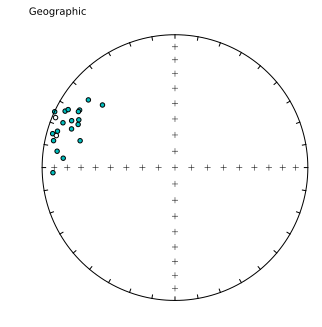

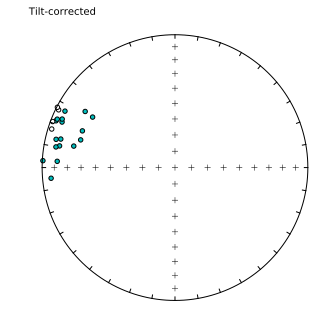


tightest grouping of vectors obtained at (95% confidence bounds):
8 - 98 percent unfolding
range of all bootstrap samples: 
-10  -  119 percent unfolding


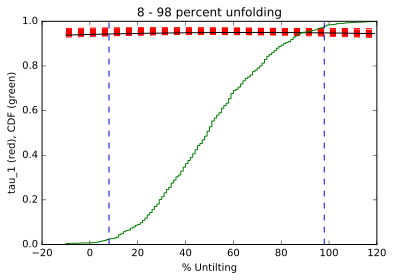

In [45]:
ipmag.bootstrap_fold_test(np.array(SS_diddd))

Paleomagnetic site means of the Cuesta Member andesite are plotted below. Only two Cuesta Member flows were identified in the field, so a Cuesta Member mean would not have much significance.

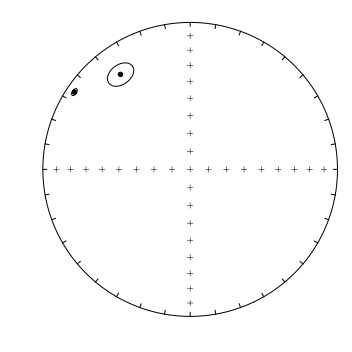

In [46]:
plt.figure(num=1,figsize=(5,5))
ipmag.plot_net(1)

CM_dec = CM_final_tc['average_dec'].tolist()
CM_inc = CM_final_tc['average_inc'].tolist()
CM_a95 = CM_final_tc['average_alpha95'].tolist()

for i in range(len(CM_dec)):
    ipmag.plot_di_mean(CM_dec[i], CM_inc[i], CM_a95[i])

plt.show()

## Combine new Michipicoten data with Palmer and Davis (1987)

Given that we have obtained U-Pb dates for the West Sand Bay tuff and the Davieaux Island Member rhyolite, we are interested in generating a pole that is bracketed by these dates. The units between and including these dates are the West Sand Bay Member, the Quebec Harbor Member, the East Sand Bay Member, the South Shore Member and the Davieaux Island Member. Therefore we combine our data from the South Shore Member with the Quebec Harbour Member and Davieaux Island Member data from Palmer and Davis (1987).

In [47]:
Michipicoten_Island_Fm.iloc[[3,7], :]

,study,site,dec_tc,inc_tc,a95,n,site_lat,site_lon,formation,member,site_R,site_kappa,comment,paleolatitude,vgp_lat,vgp_lon,vgp_lat_rev,vgp_lon_rev
3,Palmer1987,2 and 4,307.244661,39.086265,23.000000,9,47.71,-85.94,Michipicoten_Island,Quebec_Harbour_Member,1.991427,116.65500,Fisher mean of site means 2 and 4,22.104038,40.970516,171.701143,-40.970516,351.701143
7,Palmer1987,15 and 17,287.078283,19.133917,21.831841,9,47.70,-85.79,Michipicoten_Island,Davieaux_Island_Member,1.992479,132.95828,Fisher mean of site means 15 and 17,9.841281,18.732965,178.210301,-18.732965,358.210301


In [48]:
Palmer_data_trimmed = Michipicoten_Island_Fm.iloc[[3,7], :]
combined_Michi_lon = Palmer_data_trimmed['vgp_lon'].tolist()\
+ SS_final_tc['vgp_lon'].tolist()
combined_Michi_lat = Palmer_data_trimmed['vgp_lat'].tolist()\
+ SS_final_tc['vgp_lat'].tolist()
combined_Michi_mean = ipmag.fisher_mean(combined_Michi_lon,combined_Michi_lat)

South Shore Member pole: 
Plong: 174.7  Plat: 15.8
Number of directions in mean (n): 21
Angular radius of 95% confidence (A_95): 4.3
Precision parameter (k) estimate: 55.4

Grand mean: 
Plong: 174.7  Plat: 17.0
Number of directions in mean (n): 23
Angular radius of 95% confidence (A_95): 4.4
Precision parameter (k) estimate: 48.4


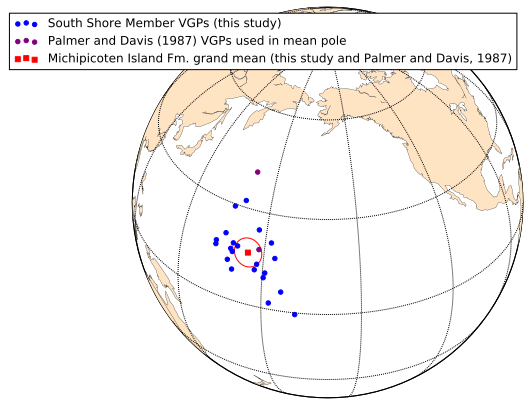

In [49]:
SS_final_mean = ipmag.fisher_mean(SS_final_tc['vgp_lon'].tolist(),
                                  SS_final_tc['vgp_lat'].tolist())

m = pole_figure_appearance()

ipmag.plot_vgp(m,SS_final_tc['vgp_lon'].tolist(),
               SS_final_tc['vgp_lat'].tolist(),
               label='South Shore Member VGPs (this study)',color='b')

ipmag.plot_vgp(m,Palmer_data_trimmed['vgp_lon'].tolist(),
               Palmer_data_trimmed['vgp_lat'].tolist(),
               label='Palmer and Davis (1987) VGPs used in mean pole',
               color='purple')

ipmag.plot_pole(m,combined_Michi_mean['dec'],combined_Michi_mean['inc'],
                combined_Michi_mean['alpha95'], label='Michipicoten Island Fm. \
grand mean (this study and Palmer and Davis, 1987)',
                marker='s',markersize=25, color='red')

plt.legend()
plt.savefig('Code_output/Michi_VGPs.pdf')

print "South Shore Member pole: "
ipmag.print_pole_mean(SS_final_mean)

print "\nGrand mean: "
ipmag.print_pole_mean(combined_Michi_mean)

plt.show()

{'Dec': 174.68056363405637,
 'Inc': 16.974664865055974,
 'Me': 0.8235241344357922,
 'Me_critical': 1.094,
 'Mode': 'Mode 1',
 'Mu': 1.1041506813063025,
 'Mu_critical': 1.207,
 'N': 23,
 'Test_result': 'consistent with Fisherian model'}

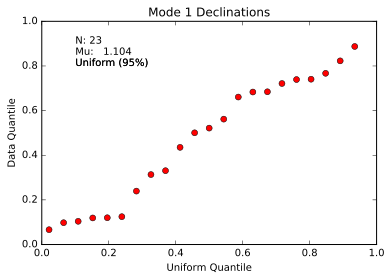

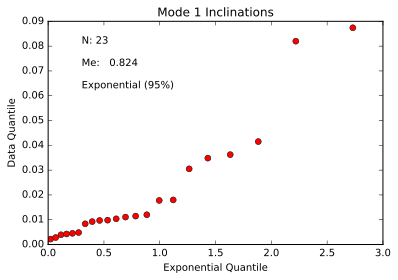

In [50]:
ipmag.fishqq(combined_Michi_lon,combined_Michi_lat)

## Paleogeography of Laurentia
### Late Rift Poles Compilation

Here we compile selected paleomagnetic poles of the Keweenawan Track and add our newly developed data. This section of the code integrates the functionality of the GPlates software for our paleogeographic reconstruction of Laurentia. The ```pygplates``` package is a dependecy of the following code blocks and is imported below. If you wish to render this notebook interactively, the ```pygplates``` package can be downloaded from the GPlates website: http://www.gplates.org/download.html

In [51]:
# If this code block gives an error after you have already 
# installed PyGPlates, you probably still need to add the package to your path
import pygplates

In [52]:
# 1080 Ma = Nonesuch pole in recon, 1070 Ma = Freda pole, 1050 = Jacobsville
for reconstruction_time in [1109, 1105, 1100, 1097, 1090, 1083, 1080, 1070, 1050]:
    rotation_model = pygplates.RotationModel('../Data/Reconstruction/Late_Rift_recon.rot')
    plate = pygplates.FeatureCollection('../Data/Reconstruction/1000_Laurentia.gpml')
    plate_outline = pygplates.FeatureCollection('../Data/Reconstruction/1000_Laurentia2.gpml')
    export_filename = './Code_output/Reconstructions/reconstructed_{0}Ma.shp'.format(reconstruction_time)
    export_outline_filename = './Code_output/Reconstructions/reconstructed_outline_{0}Ma.shp'.format(reconstruction_time)
    pygplates.reconstruct(plate, rotation_model, export_filename, reconstruction_time)
    pygplates.reconstruct(plate_outline, rotation_model, export_outline_filename, reconstruction_time)

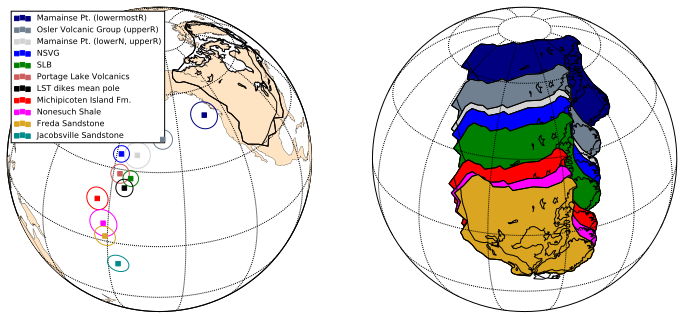

In [53]:
fig = plt.figure(figsize=(12,6))
ax1 = fig.add_subplot(121)
m = Basemap(projection='ortho',lat_0=35,lon_0=200,resolution='c',
            area_thresh=50000)
ax1.set_aspect(30, adjustable='box')
m.drawcoastlines(linewidth=0.25)
m.fillcontinents(color='bisque',lake_color='white')
m.drawmapboundary(fill_color='white')
m.drawmeridians(np.arange(0,360,30))
m.drawparallels(np.arange(-90,90,30))
m.readshapefile('../Data/Reconstruction/Laurentia', 'Laurentia', linewidth=1)
# Swanson-Hysell et al., 2014a -- 1100 Ma
ipmag.plot_pole(m, 227.0, 49.5, 5.3, marker='s', color='navy', 
                label='Mamainse Pt. (lowermostR)')
# Swanson-Hysell et al., 2014b -- 1105 Ma
ipmag.plot_pole(m, -158.3, 42.5, 3.7, marker='s', color='slategrey', 
                label='Osler Volcanic Group (upperR)')
# Swanson-Hysell et al., 2014a -- 1100 Ma
ipmag.plot_pole(m, -170.3, 36.1, 4.9, marker='s', color='lightgray', 
                label='Mamainse Pt. (lowerN, upperR)')
# Tauxe and Kodama (2009) -- 1097 Ma
ipmag.plot_pole(m,NSVG_nswu_mean['dec'],NSVG_nswu_mean['inc'],
                NSVG_nswu_mean['alpha95'], marker='s',color='b',label='NSVG')
# this study + Tauxe and Kodama (2009) -- 1090 Ma
ipmag.plot_pole(m,combined_SLB_mean['dec'],combined_SLB_mean['inc'],
                combined_SLB_mean['alpha95'], marker='s',color='g',
                label='SLB')
# Kulakov (2014) -- 1093 Ma
ipmag.plot_pole(m, 182.9, 28.3, 3.6, marker='s', color='indianred', 
                label='Portage Lake Volcanics')
# Kulakov et al. (2013)
ipmag.plot_pole(m,LST_all_mean['dec'],LST_all_mean['inc'],
                LST_all_mean['alpha95'], label='LST dikes mean pole',
                marker='s')
# this study + Palmer and Davis (1987) -- 1083 Ma
ipmag.plot_pole(m,combined_Michi_mean['dec'],combined_Michi_mean['inc'],
                combined_Michi_mean['alpha95'],
                label='Michipicoten Island Fm.',marker='s', color='red')
# Henry et al. (1977)
ipmag.plot_pole(m, 178.1, 7.6, 5.5, label='Nonesuch Shale',
                marker='s', color='magenta')
# Henry et al. (1977)
ipmag.plot_pole(m, 179, 2.2, 4.2,label='Freda Sandstone', 
                marker='s', color='goldenrod')
# Roy et al. (1978)
ipmag.plot_pole(m, 184, -10, 4.2,label='Jacobsville Sandstone', 
                marker='s', color='darkcyan')

ax1.legend(fontsize=8, loc='upper left')

ax2 = fig.add_subplot(122)
m = Basemap(projection='ortho', lat_0=30, lon_0=-16)
m.drawmapboundary(fill_color='white')
m.drawmeridians(np.arange(0,360,30))
m.drawparallels(np.arange(-90,90,30))
m.readshapefile('./Code_output/Reconstructions/reconstructed_outline_{0}Ma'.format(1109),
                'Mamainse_lowermost', color='navy', linewidth=1)
patches   = []
for info, shape in zip(m.Mamainse_lowermost_info, m.Mamainse_lowermost):
    patches.append( Polygon(np.array(shape), True) )
ax2.add_collection(PatchCollection(patches, facecolor= 'navy', edgecolor='k', 
                                   linewidths=1., zorder=2))
m.readshapefile('./Code_output/Reconstructions/reconstructed_{0}Ma'.format(1109),
                'Mamainse_lowermost', color='k', linewidth=1)
m.readshapefile('./Code_output/Reconstructions/reconstructed_outline_{0}Ma'.format(1105),
                'Osler_outline', color='slategrey', linewidth=1)
patches   = []
for info, shape in zip(m.Osler_outline_info, m.Osler_outline):
    patches.append( Polygon(np.array(shape), True) )
ax2.add_collection(PatchCollection(patches, facecolor= 'slategrey', 
                                   edgecolor='k', linewidths=1., zorder=2))
m.readshapefile('./Code_output/Reconstructions/reconstructed_{0}Ma'.format(1105),
                'Osler', color='k', linewidth=1)
m.readshapefile('./Code_output/Reconstructions/reconstructed_outline_{0}Ma'.format(1100),
                'Mamainse', color='lightgray', linewidth=1)
patches   = []
for info, shape in zip(m.Mamainse_info, m.Mamainse):
    patches.append( Polygon(np.array(shape), True) )
ax2.add_collection(PatchCollection(patches, facecolor= 'lightgray', 
                                   edgecolor='k', linewidths=1., zorder=2))
m.readshapefile('./Code_output/Reconstructions/reconstructed_{0}Ma'.format(1100),
                'Mamainse', color='k', linewidth=1)
m.readshapefile('./Code_output/Reconstructions/reconstructed_outline_{0}Ma'.format(1097),
                'NSVG', color='b', linewidth=1)
patches = []
for info, shape in zip(m.NSVG_info, m.NSVG):
    patches.append( Polygon(np.array(shape), True) )
ax2.add_collection(PatchCollection(patches, facecolor= 'b', edgecolor='k', 
                                   linewidths=1., zorder=2))
m.readshapefile('./Code_output/Reconstructions/reconstructed_{0}Ma'.format(1097),
                'NSVG', color='k', linewidth=1)
m.readshapefile('./Code_output/Reconstructions/reconstructed_outline_{0}Ma'.format(1090),
                'SLB', color='g', linewidth=1)
patches = []
for info, shape in zip(m.SLB_info, m.SLB):
    patches.append( Polygon(np.array(shape), True) )
ax2.add_collection(PatchCollection(patches, facecolor= 'g', edgecolor='k', 
                                   linewidths=1., zorder=2))
m.readshapefile('./Code_output/Reconstructions/reconstructed_{0}Ma'.format(1090),
                'SLB', color='k', linewidth=1)
m.readshapefile('./Code_output/Reconstructions/reconstructed_outline_{0}Ma'.format(1083),
                'Michipicoten', color='r', linewidth=1)
patches = []
for info, shape in zip(m.Michipicoten_info, m.Michipicoten):
    patches.append( Polygon(np.array(shape), True) )
ax2.add_collection(PatchCollection(patches, facecolor= 'r', edgecolor='k', 
                                   linewidths=1., zorder=2))
m.readshapefile('./Code_output/Reconstructions/reconstructed_{0}Ma'.format(1083),
                'Michipicoten', color='k', linewidth=1)
m.readshapefile('./Code_output/Reconstructions/reconstructed_outline_{0}Ma'.format(1080),
                'Nonesuch', color='magenta', linewidth=1)
patches = []
for info, shape in zip(m.Nonesuch_info, m.Nonesuch):
    patches.append( Polygon(np.array(shape), True) )
ax2.add_collection(PatchCollection(patches, facecolor= 'magenta', 
                                   edgecolor='k', linewidths=1., zorder=2))
m.readshapefile('./Code_output/Reconstructions/reconstructed_{0}Ma'.format(1080),
                'Nonesuch', color='k', linewidth=1)
m.readshapefile('./Code_output/Reconstructions/reconstructed_outline_{0}Ma'.format(1070),
                'Freda', color='goldenrod', linewidth=1)
patches = []
for info, shape in zip(m.Freda_info, m.Freda):
    patches.append( Polygon(np.array(shape), True) )
ax2.add_collection(PatchCollection(patches, facecolor= 'goldenrod', 
                                   edgecolor='k', linewidths=1., zorder=2))
m.readshapefile('./Code_output/Reconstructions/reconstructed_{0}Ma'.format(1070),
                'Freda', color='k', linewidth=1)
#plt.savefig('Code_output/poles.pdf')
plt.show()

### Rates of plate motion

Using the reference location of Duluth, MN we determine the latitudinal rate of motion implied by pairs of paleomagnetic poles and  utilize the Monte Carlo rates estimate approach of Swanson-Hysell et al., 2014 to estimate the uncertainty on these estimates.

In [54]:
%config InlineBackend.figure_formats = {'retina',}

In [55]:
def plate_rate_mc(pole1_plon,pole1_plat,pole1_A95,pole1_kappa,pole1_N,pole1_age,pole1_age_error,
                  pole2_plon,pole2_plat,pole2_A95,pole2_kappa,pole2_N,pole2_age,pole2_age_error,
                  ref_loc_lon,ref_loc_lat,samplesize=10000, save_name=None):
    """
    Determine the latitudinal motion implied by a pair of poles and utilize
    the Monte Carlo sampling method of Swanson-Hysell (2014) to determine the
    associated uncertainty.
    
    These values are required for pole1 and pole2:
    ----------------------------
    plon: longitude of pole
    plat: latitude of pole
    A95: Fisher confidence ellipse for pole
    kappa: Fisher precision parameter for pole
    N: number of VGPs in pole
    age: age assigned to pole in Ma
    age_error: 1 sigma age uncertainty in million years

    Additional required parameters:
    ----------------------------
    ref_loc_lon: longitude of reference location
    ref_loc_lat: latitude of reference location
    samplesize: number of Monte Carlo draws from pole and age distributions
    """

    ref_loc = [ref_loc_lon,ref_loc_lat]
    pole1=(pole1_plon, pole1_plat)
    pole1_paleolat=90-pmag.angle(pole1,ref_loc)
    pole2=(pole2_plon, pole2_plat)
    pole2_paleolat=90-pmag.angle(pole2,ref_loc)
    print "The paleolatitude for ref_loc resulting from pole 1 is:" + str(pole1_paleolat)
    print "The paleolatitude for ref_loc resulting from pole 2 is:" + str(pole2_paleolat)
    rate=((pole1_paleolat-pole2_paleolat)*111*100000)/((pole1_age-pole2_age)*1000000)
    print "The rate of paleolatitudinal change implied by the poles pairs in cm/yr is:" + str(rate)

    pole1_MCages=np.random.normal(pole1_age,pole1_age_error,samplesize)
    pole2_MCages=np.random.normal(pole2_age,pole2_age_error,samplesize)

    plt.hist(pole1_MCages,100,histtype='stepfilled',color='darkred',label='Pole 1 ages')
    plt.hist(pole2_MCages,100,histtype='stepfilled',color='darkblue',label='Pole 2 ages')
    plt.xlabel('Age (Ma)')
    plt.ylabel('n')
    plt.legend(loc=3)
    plt.savefig('Code_output/{0}_1.svg'.format(save_name))
    plt.show()

    pole1_MCpoles=[]
    pole1_MCpole_lat=[]
    pole1_MCpole_long=[]
    pole1_MCpaleolat=[]
    for n in range(samplesize):
        vgp_samples=[]
        for vgp in range(pole1_N):
            #pmag.dev returns a direction from a fisher distribution with specified kappa
            direction_atN=pmag.fshdev(pole1_kappa)
            #this direction is centered at latitude of 90º and needs to be rotated
            #to be centered on the mean pole position
            tilt_direction=pole1_plon
            tilt_amount=90-pole1_plat
            direction=pmag.dotilt(direction_atN[0],direction_atN[1],tilt_direction,tilt_amount)
            vgp_samples.append([direction[0],direction[1],1.])
        mean=pmag.fisher_mean(vgp_samples)
        mean_pole_position=(mean['dec'],mean['inc'])
        pole1_MCpoles.append([mean['dec'],mean['inc'],1.])
        pole1_MCpole_lat.append(mean['inc'])
        pole1_MCpole_long.append(mean['dec'])
        paleolat=90-pmag.angle(mean_pole_position,ref_loc)
        pole1_MCpaleolat.append(paleolat[0])

    pole2_MCpoles=[]
    pole2_MCpole_lat=[]
    pole2_MCpole_long=[]
    pole2_MCpaleolat=[]
    for n in range(samplesize):
        vgp_samples=[]
        for vgp in range(pole2_N):
            #pmag.dev returns a direction from a fisher distribution with specified kappa
            direction_atN=pmag.fshdev(pole2_kappa)
            #this direction is centered at latitude of 90º and needs to be rotated
            #to be centered on the mean pole position
            tilt_direction=pole2_plon
            tilt_amount=90-pole2_plat
            direction=pmag.dotilt(direction_atN[0],direction_atN[1],tilt_direction,tilt_amount)
            vgp_samples.append([direction[0],direction[1],1.])
        mean=pmag.fisher_mean(vgp_samples)
        mean_pole_position=(mean['dec'],mean['inc'])
        pole2_MCpoles.append([mean['dec'],mean['inc'],1.])
        pole2_MCpole_lat.append(mean['inc'])
        pole2_MCpole_long.append(mean['dec'])
        paleolat=90-pmag.angle(mean_pole_position,ref_loc)
        pole2_MCpaleolat.append(paleolat[0])
        
    plt.figure(figsize=(5, 5))
    m = Basemap(projection='ortho',lat_0=35,lon_0=200,resolution='c',area_thresh=50000)
    m.drawcoastlines(linewidth=0.25)
    m.fillcontinents(color='bisque',lake_color='white',zorder=1)
    m.drawmapboundary(fill_color='white')
    m.drawmeridians(np.arange(0,360,30))
    m.drawparallels(np.arange(-90,90,30))

    ipmag.plot_vgp(m,pole1_MCpole_long,pole1_MCpole_lat,color='b')
    ipmag.plot_vgp(m,pole2_MCpole_long,pole2_MCpole_lat,color='g')
    plt.savefig('Code_output/{0}_2.svg'.format(save_name))

    #calculating the change in paleolatitude between the Monte Carlo pairs
    pole1_pole2_Delta_degrees=[]
    pole1_pole2_Delta_kilometers=[]
    pole1_pole2_Delta_myr=[]
    pole1_pole2_degrees_per_myr=[]
    pole1_pole2_cm_per_yr=[]

    for n in range(samplesize):
        Delta_degrees=pole1_MCpaleolat[n]-pole2_MCpaleolat[n]
        Delta_Myr=pole1_MCages[n]-pole2_MCages[n]
        pole1_pole2_Delta_degrees.append(Delta_degrees)
        degrees_per_myr=Delta_degrees/Delta_Myr
        cm_per_yr=((Delta_degrees*111)*100000)/(Delta_Myr*1000000)
        pole1_pole2_degrees_per_myr.append(degrees_per_myr)
        pole1_pole2_cm_per_yr.append(cm_per_yr)

    plotnumber=100
    plt.figure(num=None, figsize=(10, 4))

    plt.subplot(1, 2, 1)
    for n in range(plotnumber):
        plt.plot([pole1_MCpaleolat[n],pole2_MCpaleolat[n]],
                 [pole1_MCages[n],pole2_MCages[n]],'k-',linewidth=0.1,alpha=0.3)
    plt.scatter(pole1_MCpaleolat[:plotnumber],pole1_MCages[:plotnumber],color='b',s=3)
    plt.scatter(pole1_paleolat,pole1_age,color='lightblue',s=100, edgecolor='w', zorder=10000)
    plt.scatter(pole2_MCpaleolat[:plotnumber],pole2_MCages[:plotnumber],color='g',s=3)
    plt.scatter(pole2_paleolat,pole2_age,color='lightgreen',s=100, edgecolor='w', zorder=10000)
    plt.plot([pole1_paleolat,pole2_paleolat],[pole1_age,pole2_age],'w-',linewidth=2)
    plt.gca().invert_yaxis()
    plt.xlabel('paleolatitude at Duluth, MN (degrees)',size=14)
    plt.ylabel('time (Ma)',size=14)

    plt.subplot(1, 2, 2)
    plt.hist(pole1_pole2_cm_per_yr,bins=600)
    plt.ylabel('n',size=14)
    plt.xlabel('latitudinal drift rate (cm/yr)',size=14)
    plt.xlim([0,90])
    plt.savefig('Code_output/{0}_3.svg'.format(save_name))
    plt.show()

    twopointfive_percentile=stats.scoreatpercentile(pole1_pole2_cm_per_yr,2.5)
    fifty_percentile=stats.scoreatpercentile(pole1_pole2_cm_per_yr,50)
    ninetysevenpointfive_percentile=stats.scoreatpercentile(pole1_pole2_cm_per_yr,97.5)
    print "2.5th percentile is: " + str(twopointfive_percentile)
    print "50th percentile is: " + str(fifty_percentile)
    print "97.5th percentile is: " + str(ninetysevenpointfive_percentile)

#### Latitudinal motion implied by Osler and Michipicoten poles

The paleolatitude for ref_loc resulting from pole 1 is:[ 44.05491798241043]
The paleolatitude for ref_loc resulting from pole 2 is:[ 10.19359397210863]
The rate of paleolatitudinal change implied by the poles pairs in cm/yr is:[ 17.257148600291572]


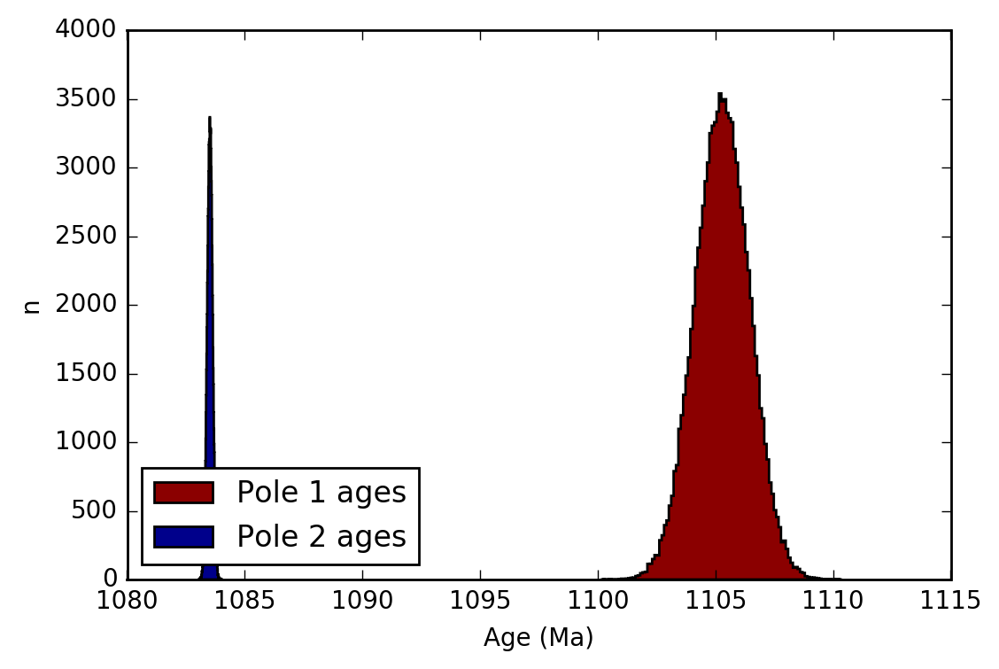

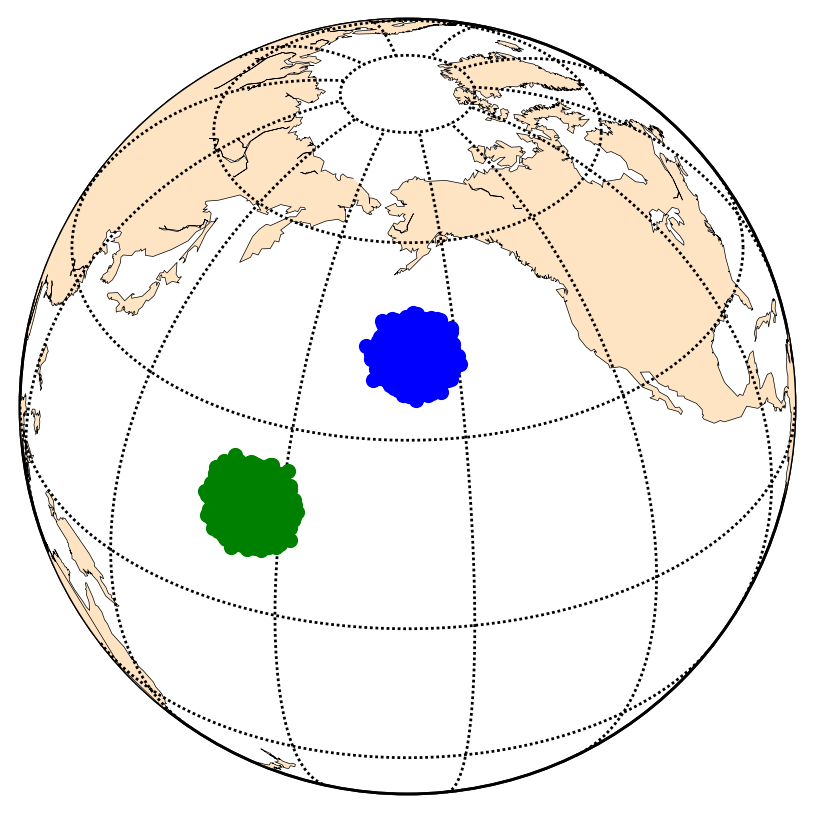

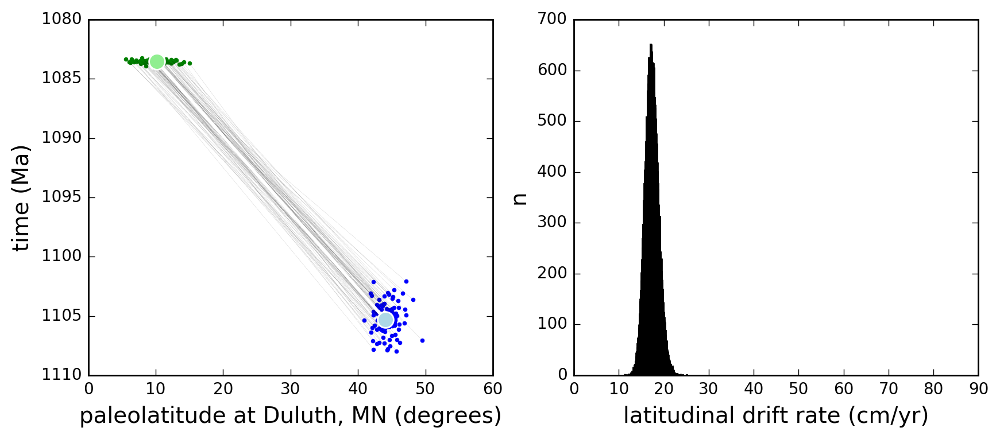

2.5th percentile is: 14.5145242581
50th percentile is: 17.2540302248
97.5th percentile is: 20.3623124876


In [56]:
#parameters for pole 1 (Osler upper R pole; Swanson-Hysell et al., 2014)
pole1_plon=201.6
pole1_plat=42.5
pole1_A95=3.7
pole1_kappa=25.7
pole1_N=59
pole1_age=1105.3
#1 sigma age uncertainty 
#pole1_age_error=.33/2
pole1_age_error=2.3/2

#parameters for pole 2 (Michipicoten pole; this study)
pole2_plon=combined_Michi_mean['dec']
pole2_plat=combined_Michi_mean['inc']
pole2_A95=combined_Michi_mean['alpha95']
pole2_kappa=combined_Michi_mean['k']
pole2_N=combined_Michi_mean['n']
#being conservative about the rate by utilizing the younger MI date
#MI_DI1
pole2_age=1083.52
pole2_age_error=.23/2

#the longitude, latitude of Duluth, MN as a reference location
ref_loc_lon = 267.9
ref_loc_lat = 46.8

plate_rate_mc(pole1_plon,pole1_plat,pole1_A95,pole1_kappa,pole1_N,pole1_age,pole1_age_error,
                  pole2_plon,pole2_plat,pole2_A95,pole2_kappa,pole2_N,pole2_age,pole2_age_error,
                  ref_loc_lon,ref_loc_lat,samplesize=100000, save_name='OslerMichipicoten')

#### Latitudinal motion implied by Mamainse lowerN/upperR and Michipicoten poles

The paleolatitude for ref_loc resulting from pole 1 is:[ 32.861755262601932]
The paleolatitude for ref_loc resulting from pole 2 is:[ 10.19359397210863]
The rate of paleolatitudinal change implied by the poles pairs in cm/yr is:[ 14.941602750859671]


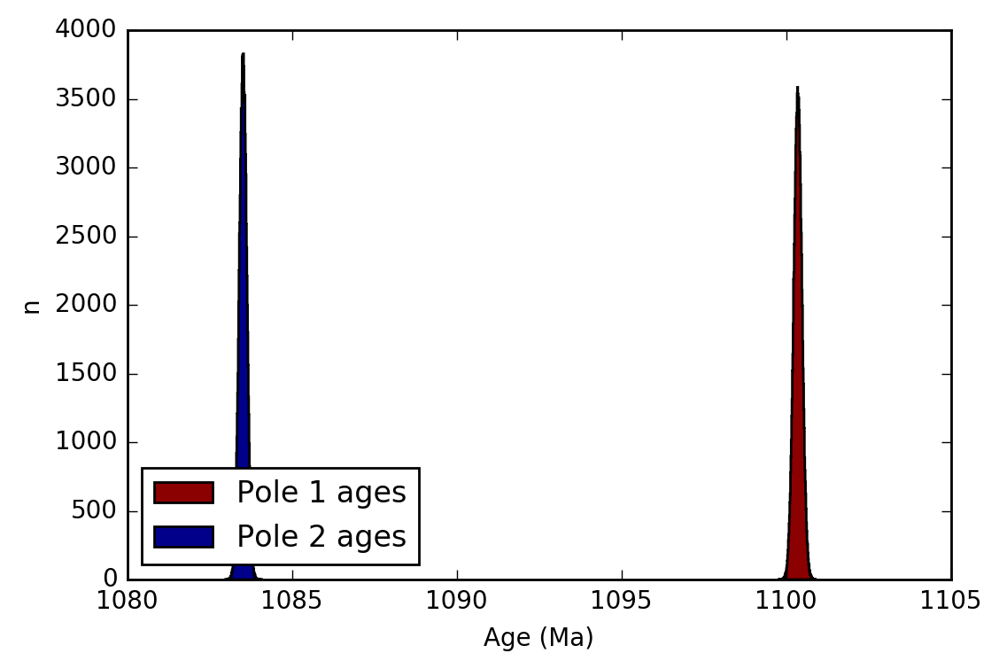

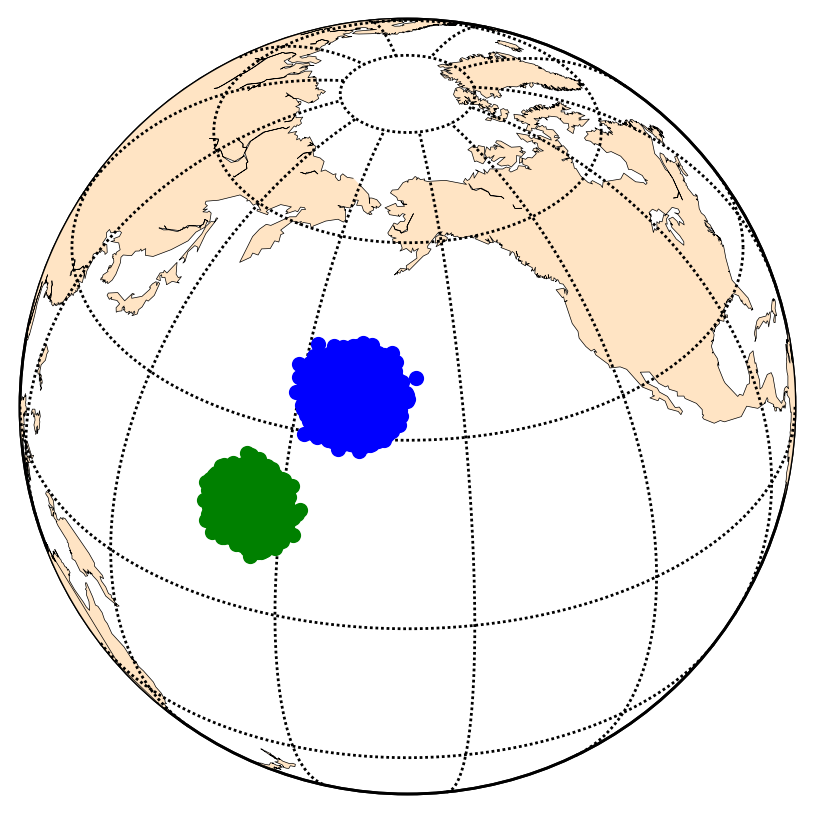

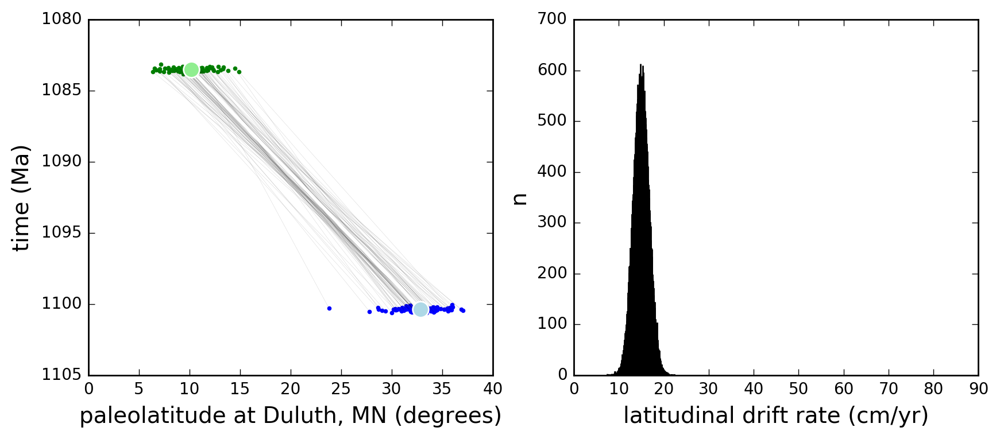

2.5th percentile is: 11.5541972264
50th percentile is: 14.9227483503
97.5th percentile is: 18.3299302924


In [57]:
#parameters for pole 1 (MP lower N & upper R)
pole1_plon = 189.7
pole1_plat = 36.1
pole1_A95 = 4.9
pole1_kappa = 37.3
pole1_N = 24
pole1_age = 1100.36
#1 sigma age uncertainty 
pole1_age_error=.25/2

#parameters for pole 2 (Michipicoten pole)
pole2_plon=combined_Michi_mean['dec']
pole2_plat=combined_Michi_mean['inc']
pole2_A95=combined_Michi_mean['alpha95']
pole2_kappa=combined_Michi_mean['k']
pole2_N=combined_Michi_mean['n']
#being conservative about the rate by utilizing the younger MI date
#MI_DI1
pole2_age=1083.52
pole2_age_error=.23/2

#the longitude, latitude of Duluth, MN as a reference location
ref_loc_lon = 267.9
ref_loc_lat = 46.8

plate_rate_mc(pole1_plon,pole1_plat,pole1_A95,pole1_kappa,pole1_N,pole1_age,pole1_age_error,
                  pole2_plon,pole2_plat,pole2_A95,pole2_kappa,pole2_N,pole2_age,pole2_age_error,
                  ref_loc_lon,ref_loc_lat,samplesize=100000, save_name='MamainseMichipicoten')

#### Latitudinal motion implied by NSVG (upper SW) and Michipicoten poles

The paleolatitude for ref_loc resulting from pole 1 is:[ 27.82536151959053]
The paleolatitude for ref_loc resulting from pole 2 is:[ 10.19359397210863]
The rate of paleolatitudinal change implied by the poles pairs in cm/yr is:[ 18.325151664517595]


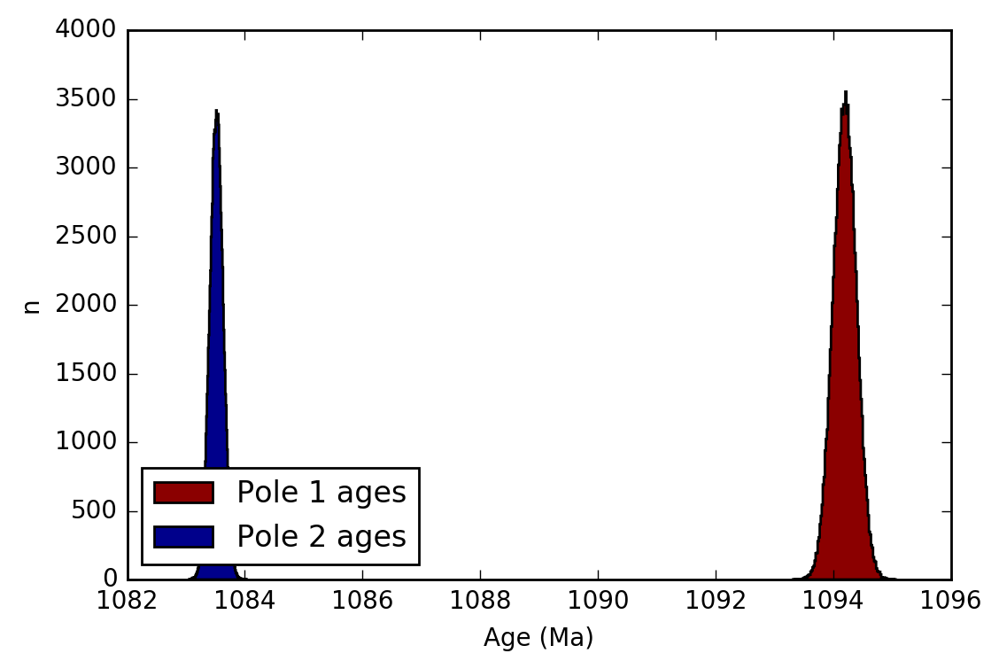

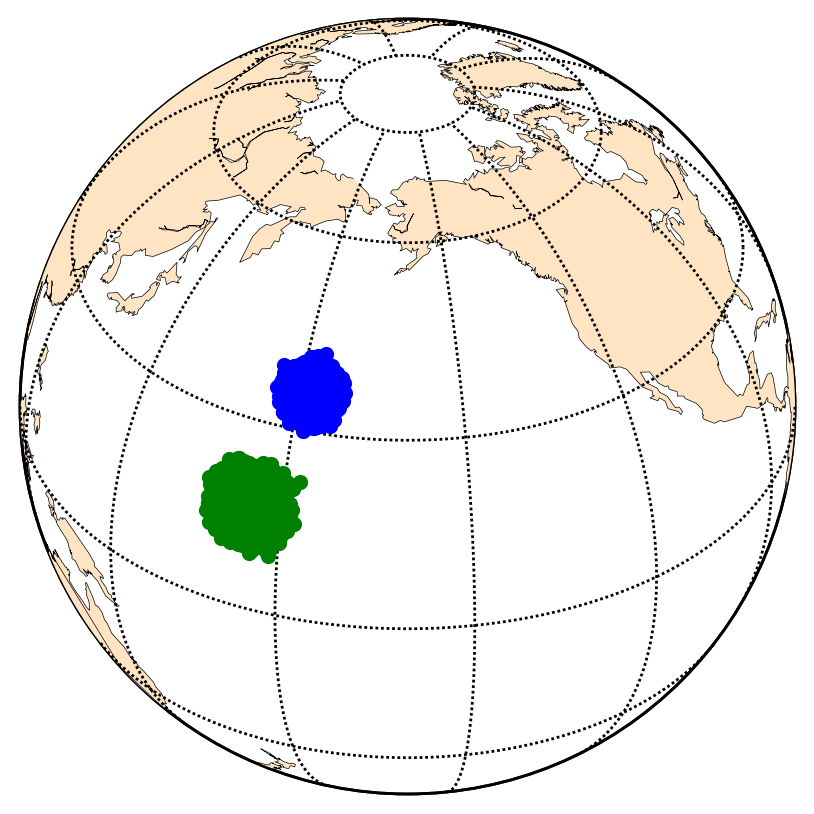

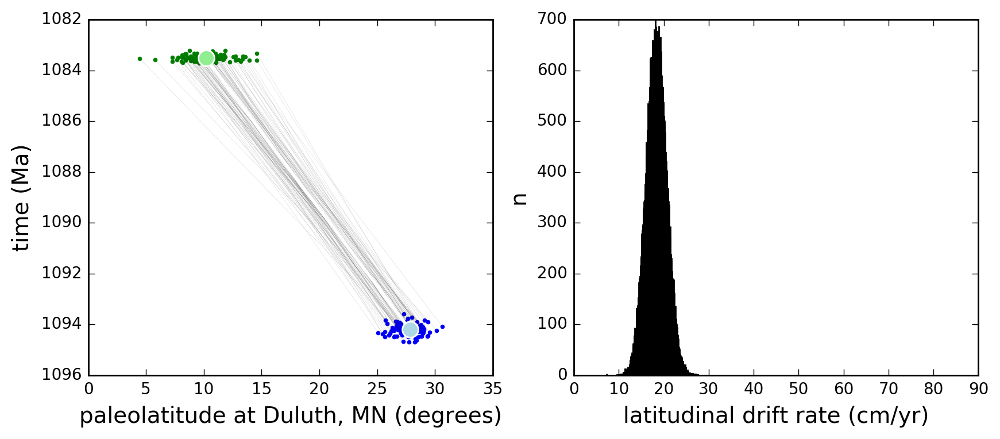

2.5th percentile is: 13.9369805679
50th percentile is: 18.3224606435
97.5th percentile is: 22.7501840232


In [58]:
#parameters for pole 1 (NSVG NSWU; Tauxe et al., 2009)
pole1_plon = NSVG_nswu_mean['dec']
pole1_plat = NSVG_nswu_mean['inc']
pole1_A95 = NSVG_nswu_mean['alpha95']
pole1_kappa = NSVG_nswu_mean['k']
pole1_N = int(NSVG_nswu_mean['n'])
#date of Palisade Rhyolite from Schoene et al., 2006 
pole1_age = 1094.2
#1 sigma age uncertainty 
pole1_age_error = 0.4/2

#parameters for pole 2 (Michipicoten pole; this study)
pole2_plon=combined_Michi_mean['dec']
pole2_plat=combined_Michi_mean['inc']
pole2_A95=combined_Michi_mean['alpha95']
pole2_kappa=combined_Michi_mean['k']
pole2_N=combined_Michi_mean['n']
#being conservative about the rate by utilizing the younger MI date
#MI_DI1
pole2_age=1083.52
pole2_age_error=.23/2

#the longitude, latitude of Duluth, MN as a reference location
ref_loc_lon = 267.9
ref_loc_lat = 46.8

plate_rate_mc(pole1_plon,pole1_plat,pole1_A95,pole1_kappa,pole1_N,pole1_age,pole1_age_error,
                  pole2_plon,pole2_plat,pole2_A95,pole2_kappa,pole2_N,pole2_age,pole2_age_error,
                  ref_loc_lon,ref_loc_lat,samplesize=100000, save_name='NSVGMichipicoten')

### Age of Keweenawan sediments
#### *Nonesuch Shale*

There is much evidence to support the deposition of the Nonesuch shale shortly after or perhaps during late stage volcanism in the Midcontinent Rift (see main text). However, the magnetization of this formation cannot be dated as definitively. Symons et al. (2013) suggested that the magnetization of the Nonesuch shale is secondary, likely a product of oxidation and mineralization in the Nonesuch Formation that postdates its deposition and subsequent burial by the Freda sandstone. They dated this magnetization at 1063 $\pm$ 8 Ma by projecting Laurentia's latitudinal rate of motion to the paleolatitude implied by the Nonesuch paleomagnetic pole. Their analysis assumes a rate of motion consistent with the previously hypothesized slowdown of Laurentia during the late stage of rifting (Davis and Green, 1997). However, our results suggest no significant change in Laurentia's motion over this period. Redoing the analysis of Symons et al. (2013) with our revised rate estimates yields an age of Nonesuch shale magnetization of approximately 1078 Ma (see below).

Create a motion path of Laurentia that captures the paleolatitude of Duluth, MN at 5 myr intervals through active rifting (1108-1083 Ma).

In [59]:
# Duluth, MN
SeedPoint = (46.78,-92.1)
MovingPlate = 1000
RelativePlate = 0
times = np.arange(1083,1108,5)

# Create a motion path feature
digitisation_time = 0
seed_points_at_digitisation_time = pygplates.MultiPointOnSphere([SeedPoint]) 
motion_path_feature = pygplates.Feature.create_motion_path(
        seed_points_at_digitisation_time,
        times,
        valid_time=(1110, 1000),
        relative_plate=RelativePlate,
        reconstruction_plate_id = MovingPlate)

# Create the shape of the motion path
reconstruction_time = 1083
reconstructed_motion_paths = []
pygplates.reconstruct(motion_path_feature, rotation_model, 
                      reconstructed_motion_paths, reconstruction_time,
                      reconstruct_type=pygplates.ReconstructType.motion_path)

# get the reconstructed coordinates into numpy arrays
for reconstructed_motion_path in reconstructed_motion_paths:
    trail = reconstructed_motion_path.get_motion_path().to_lat_lon_array()

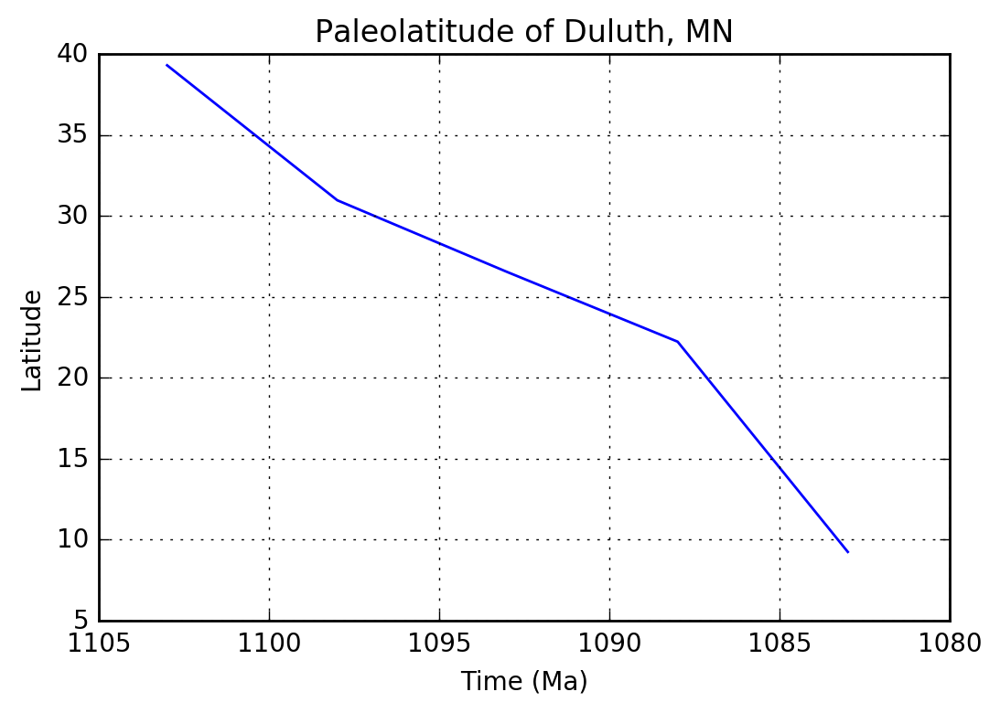

In [60]:
plt.plot(times,np.flipud(trail[:,0]))
plt.title('Paleolatitude of Duluth, MN')
plt.xlabel('Time (Ma)')
plt.ylabel('Latitude')
plt.gca().grid()
plt.gca().invert_xaxis()
plt.show()

The latitudinal change plotted above appears fairly constant. We therefore make a least squares fit to this data below.

In [61]:
m, c = np.linalg.lstsq(np.vstack([times, np.ones(len(times))]).T,
                       np.flipud(trail[:,0]))[0]
print 'Rate of Laurentia\'s latitudinal motion = %0.4f degrees/myr' % (m)
print 'or %0.4f cm/yr' % (m*11.132)

Rate of Laurentia's latitudinal motion = 1.3767 degrees/myr
or 15.3254 cm/yr


Inferred age of Nonesuch Shale if Laurentia
continued moving at the same rate after Midcontinent Rift volcanism ended:
1078.4340 Ma


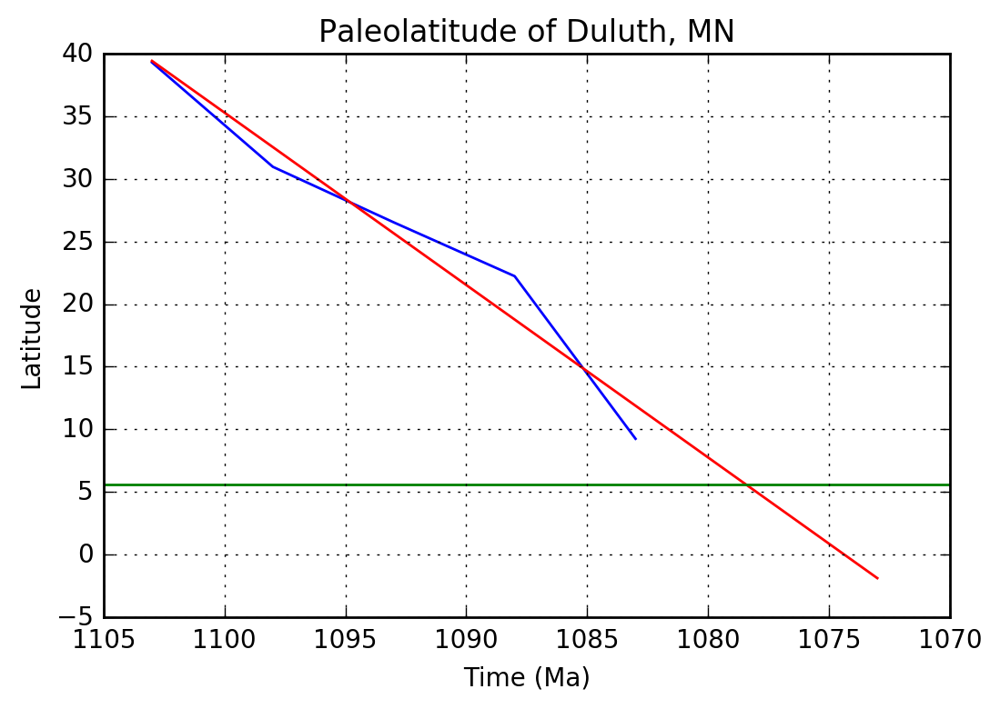

In [62]:
plt.plot(times,np.flipud(trail[:,0]))
times_new = np.arange(1073,1108,5)
plt.plot(times_new, m*times_new + c, 'r')
# Paleolatitude of Nonesuch is 5.6 degrees
plt.plot([1070,1105], [5.6,5.6])
NS_inferred_age = (5.6-c)/m
print 'Inferred age of Nonesuch Shale if Laurentia\n\
continued moving at the same rate after Midcontinent Rift volcanism ended:\n\
%0.4f Ma' % (NS_inferred_age)
plt.title('Paleolatitude of Duluth, MN')
plt.xlabel('Time (Ma)')
plt.ylabel('Latitude')
plt.gca().grid()
plt.gca().invert_xaxis()
plt.show()

#### *Jacobsville Sandstone*

New detrital zircon dates from the Jacobsville sandstone, which unconformably overlies the Freda sandstone, reveal a much younger age for this formation than estimated for the Oronto Group sediments ($<$959 $\pm$ 19 Ma; Malone et al., 2015). The paleolatitude of Laurentia implied by the Neoproterozoic APWP was then matched with that implied by the Jacobsville paleomagnetic pole, yielding a set of possible ages for Jacobsville deposition: ~780-755, ~700-610 or ~570-555 Ma (Malone et al., 2015). Motivations for redoing this analysis with paleomagnetic poles from both the APWP of Laurentia and the APWP of Baltica (hypothesized to have a longstanding connection with Laurentia's northeastern margin throughout the Neoproterozoic; Pisarevsky et al., 2003; Li et al., 2008; Evans, 2009) are outlined in the main text (*Discussion: Age of Keweenawan sediments*).

We first upload paleomagnetic poles of Laurentia as compiled by the Nordic Supercontinent Workshop, Haraldvangen, Norway in 2014 (see references in Figure 7 of the manuscript). 

In [63]:
Laurentia_poles = pd.read_csv('../Data/Reconstruction/Laurentia_Poles.csv', 
                              usecols=['Formation', 'Terrane', 'AgeUpper', 
                                       'AgeLower', 'AgeNominal', 'A95', 
                                       'SLat', 'SLon', 'PLat', 'PLon', 
                                       'RefLat', 'RefLon'])
Laurentia_poles = Laurentia_poles.sort_values(by='AgeNominal', 
                                              ascending=False)
Laurentia_poles.reset_index(inplace=True, drop=True)
Laurentia_poles

,Formation,Terrane,AgeUpper,AgeLower,AgeNominal,A95,SLat,SLon,PLat,PLon,RefLat,RefLon
0,Stillwater Complex - C2,Laurentia-Wyoming,2709,2701,2705.0,4.0,45.2,249.2,-83.6,335.8,46.78,267.9
1,MATACHEWAN R,Laurentia-Superior(East),2489,2443,2466.0,1.6,48.0,278.0,-44.1,238.3,46.78,267.9
2,MATACHEWAN N,Laurentia-Superior(East),2449,2443,2446.0,2.4,48.0,278.0,-52.3,239.5,46.78,267.9
3,Malley dykes,Laurentia-Slave,2233,2229,2231.0,6.7,64.2,249.8,-50.8,310.0,46.78,267.9
4,SENNETERRE,Laurentia-Superior(East),2224,2212,2218.0,6.0,49.0,283.0,-15.3,284.3,46.78,267.9
5,NIPISSING N1,Laurentia-Superior(East),2221,2213,2217.0,10.0,47.0,279.0,-17.0,272.0,46.78,267.9
6,Dogrib dykes,Laurentia-Slave,2195,2191,2193.0,7.0,62.5,245.5,-31.0,315.0,46.78,267.9
7,BISCOTASING,Laurentia-Superior(East),2172,2167,2170.0,7.0,48.0,280.0,26.0,223.9,46.78,267.9
8,MARATHON N,Laurentia-Superior(West),2126,2121,2124.0,7.7,49.0,275.0,45.4,198.2,46.78,267.9
9,MARATHON R,Laurentia-Superior(West),2106,2101,2104.0,7.5,49.0,275.0,55.1,182.2,46.78,267.9


The paleolatitude of Duluth, MN ("RefLat", "RefLon") is then calculated for each of these paleomagnetic poles and plotted below.

In [64]:
Laurentia_poles['Latitude'] = pd.Series(90 - np.rad2deg(np.arccos\
(np.sin(np.deg2rad(Laurentia_poles['RefLat']))\
*np.sin(np.deg2rad(Laurentia_poles['PLat']))\
+np.cos(np.deg2rad(Laurentia_poles['RefLat']))\
*np.cos(np.deg2rad(Laurentia_poles['PLat']))\
*np.cos(np.deg2rad(Laurentia_poles['RefLon']-Laurentia_poles['PLon'])))))

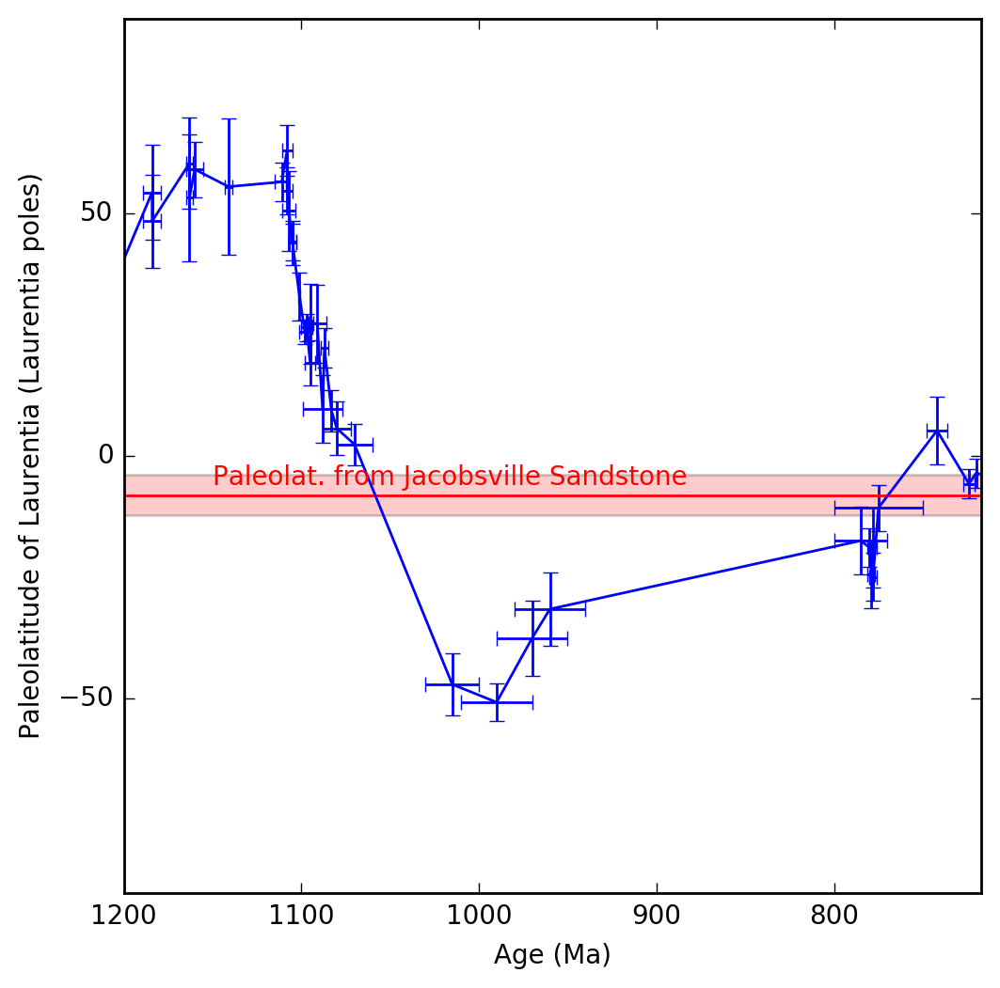

In [65]:
# First we must tweak the format of the pole list
Laurentia_copy = pd.DataFrame(Laurentia_poles, columns=['PLat','PLon'])
Laurentia_copy = Laurentia_copy.rename_axis({'PLat':'PLat_rot', 
                                             'PLon':'PLon_rot'}, 
                                            axis='columns')
Laurentia_poles['PLat_rot'] = Laurentia_copy.PLat_rot
Laurentia_poles['PLon_rot'] = Laurentia_copy.PLon_rot
Laurentia_poles['AgeNominal_neg'] = Laurentia_poles.AgeNominal.apply(np.negative)

# Plot the paleolatitude of Duluth using Laurentia poles
fig = plt.figure(figsize=(20,6))

ax1 = fig.add_subplot(131)
ax1.add_patch(mpatch.Rectangle((1300, -12.2), -1000, 8.4, 
                               facecolor='r', alpha=0.2))
ax1.plot([-8.1]*2000, 'r-')
ax1.errorbar(Laurentia_poles['AgeNominal'].tolist(), 
             Laurentia_poles['Latitude'].tolist(), 
             yerr=Laurentia_poles['A95'].tolist(), 
             xerr=(Laurentia_poles['AgeUpper']-Laurentia_poles['AgeLower'])/2)
ax1.text(1150, -6,'Paleolat. from Jacobsville Sandstone', 
         color='r', withdash=True)
# Cut off at Tonian/Cryogenian boundary
ax1.set_xlim(1200,717)
ax1.set_ylim(-90,90)
ax1.set_ylabel('Paleolatitude of Laurentia (Laurentia poles)')
ax1.set_xlabel('Age (Ma)')
plt.show()

Next, we upload paleomagnetic poles of Baltica as compiled by the Nordic Supercontinent Workshop, Haraldvangen, Norway in 2014 (see references in Figure 7 of the manuscript).

In [66]:
Baltica_poles = pd.read_csv('../Data/Reconstruction/Baltica_Poles.csv', 
                              usecols=['Formation', 'Terrane', 'AgeUpper', 
                                       'AgeLower', 'AgeNominal', 'A95', 
                                       'SLat', 'SLon', 'PLat', 'PLon', 
                                       'RefLat', 'RefLon'])
Baltica_poles = Baltica_poles.sort_values(by='AgeNominal', ascending=False)
Baltica_poles.reset_index(inplace=True, drop=True)
Baltica_poles

,Formation,Terrane,AgeUpper,AgeLower,AgeNominal,A95,SLat,SLon,PLat,PLon,RefLat,RefLon
0,Koitere sanukitoids,Baltica-Fennoscandia-Karelia,2686,2682,2684.0,19.500000,63.300000,30.600000,-67.500000,192.500000,46.78,267.9
1,Shalskiy thick gabbronorite dyke,Baltica-Fennoscandia,2512,2509,2510.5,11.525624,61.940000,36.050000,22.700000,222.100000,46.78,267.9
2,Generalskaya Layered Intrusion,Baltica-Fennoscandia,2507,2503,2505.0,10.406248,69.400002,31.000000,-42.500000,292.700012,46.78,267.9
3,Monchegorsk Intrusion,Baltica-Fennoscandia,2506,2502,2504.0,9.899495,68.000000,33.000000,1.300000,265.299988,46.78,267.9
4,Avdeev gabbronorite and thin Shalskiy diabase ...,Baltica-Fennoscandia,2510,2441,2475.5,13.953494,61.940000,36.050000,-12.300000,243.500000,46.78,267.9
5,Imandra Layered Intrusion,Baltica-Fennoscandia,2485,2407,2446.0,7.849204,67.599998,33.099998,-16.100000,280.299988,46.78,267.9
6,Karelian Dykes,Baltica-Fennoscandia,2451,2441,2446.0,6.100000,66.000000,30.700001,-19.900000,278.700012,46.78,267.9
7,Taivalkoski dyke,Baltica-Fennoscandia,2442,2372,2407.0,25.100000,65.600000,28.900000,-33.500000,276.400000,46.78,267.9
8,Taivalkoski dyke,Baltica-Fennoscandia,2357,2321,2339.0,6.300000,65.500000,28.100000,20.400000,257.300000,46.78,267.9
9,Volyn-Dniestr-Bug intrusions A-group,Baltica-Sarmatia,2081,2041,2061.0,13.700000,49.600000,29.800000,15.700000,182.900000,46.78,267.9


We then rotate these Baltica poles based on the reconstruction of Evans (2009) and do the same calculation for paleolatitude of Duluth, MN. 

In [67]:
Baltica_poles['PLat_rot'], Baltica_poles['PLon_rot'] = pmag.PTrot([81.5, 
                                                                   -110.0,
                                                                   -50.0], 
                                       Baltica_poles.PLat.tolist(), 
                                       Baltica_poles.PLon.tolist())
Baltica_poles['Latitude'] = pd.Series(90 - np.rad2deg(np.arccos\
(np.sin(np.deg2rad(Baltica_poles['RefLat']))\
*np.sin(np.deg2rad(Baltica_poles['PLat_rot']))\
+np.cos(np.deg2rad(Baltica_poles['RefLat']))\
*np.cos(np.deg2rad(Baltica_poles['PLat_rot']))\
*np.cos(np.deg2rad(Baltica_poles['RefLon']-Baltica_poles['PLon_rot'])))))

We then combined the Laurentia and Baltica poles.

In [68]:
combined_poles = Baltica_poles.append(Laurentia_poles)
combined_poles = combined_poles.sort_values(by='AgeNominal', ascending=False)
combined_poles = combined_poles.loc[combined_poles['AgeNominal']<=1200]
# Cut off at Tonian/Cryogenian boundary
combined_poles = combined_poles.loc[combined_poles['AgeNominal']>=717]
combined_poles.reset_index(inplace=True, drop=True)
combined_poles['AgeNominal_neg'] = combined_poles.AgeNominal.apply(np.negative)

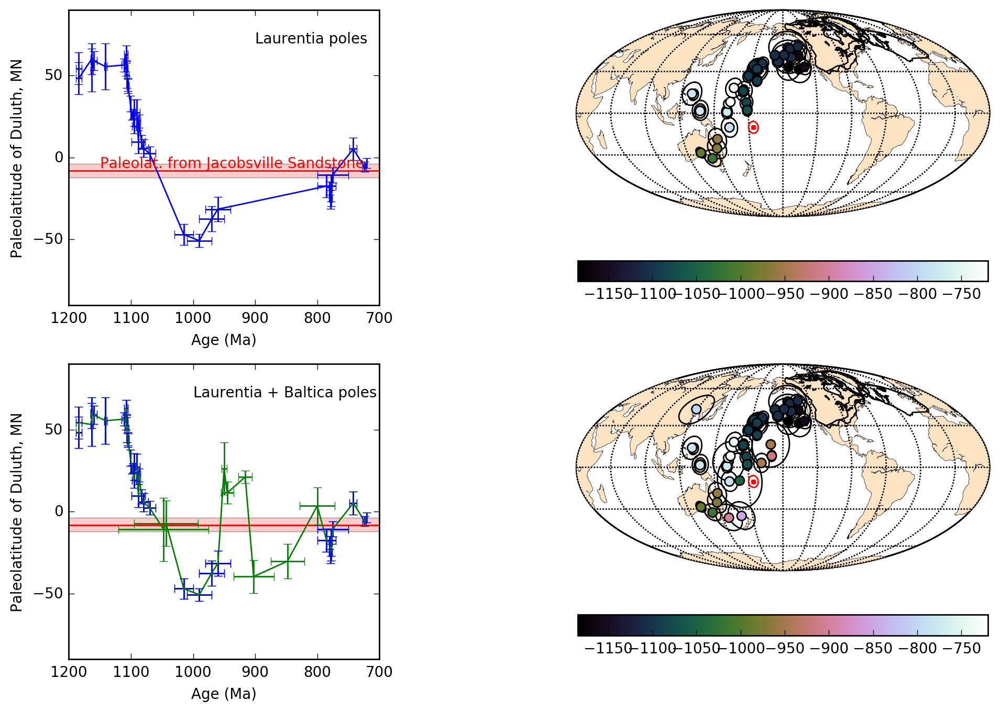

In [69]:
plt.figure(figsize=(13,8))
plt.subplot2grid((2,3), (0,1), colspan=2)
m = Basemap(projection='moll',lat_0=30,lon_0=210,resolution='c',area_thresh=50000)
m.readshapefile('../Data/Reconstruction/Laurentia_Baltica', 
                'Laurentia_Baltica', drawbounds=True, linewidth=1)
m.drawcoastlines(linewidth=0.25)
m.fillcontinents(color='bisque',lake_color='white')
m.drawmapboundary(fill_color='white')
m.drawmeridians(np.arange(0,360,30))
m.drawparallels(np.arange(-90,90,30))
Laurentia_poles = Laurentia_poles.loc[Laurentia_poles['AgeNominal']<=1200]
Laurentia_poles = Laurentia_poles.loc[Laurentia_poles['AgeNominal']>=635]
Laurentia_poles.reset_index(inplace=True, drop=True)
centerlon, centerlat = m(Laurentia_poles['PLon_rot'].tolist(),
                         Laurentia_poles['PLat_rot'].tolist())
for n in range(len(Laurentia_poles)):
    ipmag.plot_pole(m, Laurentia_poles['PLon_rot'][n],
                         Laurentia_poles['PLat_rot'][n], 
                         Laurentia_poles['A95'][n])
ipmag.plot_pole(m, 184, -10, 4.2, marker='s', color='r', markersize=6.0)
m.scatter(centerlon, centerlat, c=Laurentia_poles['AgeNominal_neg'].tolist(), 
          cmap='cubehelix', s=40, zorder=101)
plt.colorbar(orientation='horizontal', shrink=0.6)

ax1 = plt.subplot2grid((2,3), (0,0), colspan=1)
ax1.add_patch(mpatch.Rectangle((1300, -12.2), -1000, 8.4, 
                               facecolor='r', alpha=0.2))
ax1.plot([-8.1]*2000, 'r-')
ax1.errorbar(Laurentia_poles['AgeNominal'].tolist(), 
             Laurentia_poles['Latitude'].tolist(), 
             yerr=Laurentia_poles['A95'].tolist(), 
             xerr=(Laurentia_poles['AgeUpper']-Laurentia_poles['AgeLower'])/2, c='b')
ax1.text(1150, -6,'Paleolat. from Jacobsville Sandstone', 
         color='r',withdash=True)
ax1.text(900, 70,'Laurentia poles')
ax1.set_xlim(1200,700)
ax1.set_ylim(-90,90)
ax1.set_ylabel('Paleolatitude of Duluth, MN')
ax1.set_xlabel('Age (Ma)')

m = Basemap(projection='moll',lat_0=30,lon_0=210,resolution='c',
            area_thresh=50000)
plt.subplot2grid((2,3), (1,1), colspan=2)
m.readshapefile('../Data/Reconstruction/Laurentia_Baltica', 
                'Laurentia_Baltica', drawbounds=True, linewidth=1)
m.drawcoastlines(linewidth=0.25)
m.fillcontinents(color='bisque',lake_color='white')
m.drawmapboundary(fill_color='white')
m.drawmeridians(np.arange(0,360,30))
m.drawparallels(np.arange(-90,90,30))
centerlon, centerlat = m(combined_poles['PLon_rot'].tolist(),
                         combined_poles['PLat_rot'].tolist())
for n in range(len(combined_poles)):
    ipmag.plot_pole(m, combined_poles['PLon_rot'][n],
                         combined_poles['PLat_rot'][n], 
                         combined_poles['A95'][n])
ipmag.plot_pole(m, 184, -10, 4.2, marker='s', color='r', markersize=6.0)
m.scatter(centerlon, centerlat, c=combined_poles['AgeNominal_neg'].tolist(), 
          cmap='cubehelix', s=40, zorder=101)
plt.colorbar(orientation='horizontal', shrink=0.6)

ax2 = plt.subplot2grid((2,3), (1,0), colspan=1)
ax2.add_patch(mpatch.Rectangle((1300, -12.2), -1000, 8.4, 
                               facecolor='r', alpha=0.2))
ax2.plot([-8.1]*2000, 'r-')
ax2.errorbar(combined_poles['AgeNominal'].tolist(), 
             combined_poles['Latitude'].tolist(), 
             yerr=combined_poles['A95'].tolist(), 
             xerr=(combined_poles['AgeUpper']-combined_poles['AgeLower'])/2, c='g')
for n in range(len(Laurentia_poles)):
    ax2.errorbar(Laurentia_poles['AgeNominal'][n], 
                 Laurentia_poles['Latitude'][n], 
                 yerr=Laurentia_poles['A95'][n], 
                 xerr=(Laurentia_poles['AgeUpper'][n]-Laurentia_poles['AgeLower'][n])/2, c='b')
    
ax2.text(1000, 70,'Laurentia + Baltica poles')
ax2.set_xlim(1200,700)
ax2.set_ylim(-90,90)
ax2.set_ylabel('Paleolatitude of Duluth, MN')
ax2.set_xlabel('Age (Ma)')


plt.savefig('Code_output/Laur_Bal_poles.svg')
plt.show()

As seen below, the Jacobsville paleomagnetic pole aligns well with the Early Cambrian segment of Laurentia's APWP, suggesting a possible alternative Cambrian age. However, a Cambrian deposition of the Jacobsville seems unlikely when considering geological and fault relationships in the rift structure (see main text).

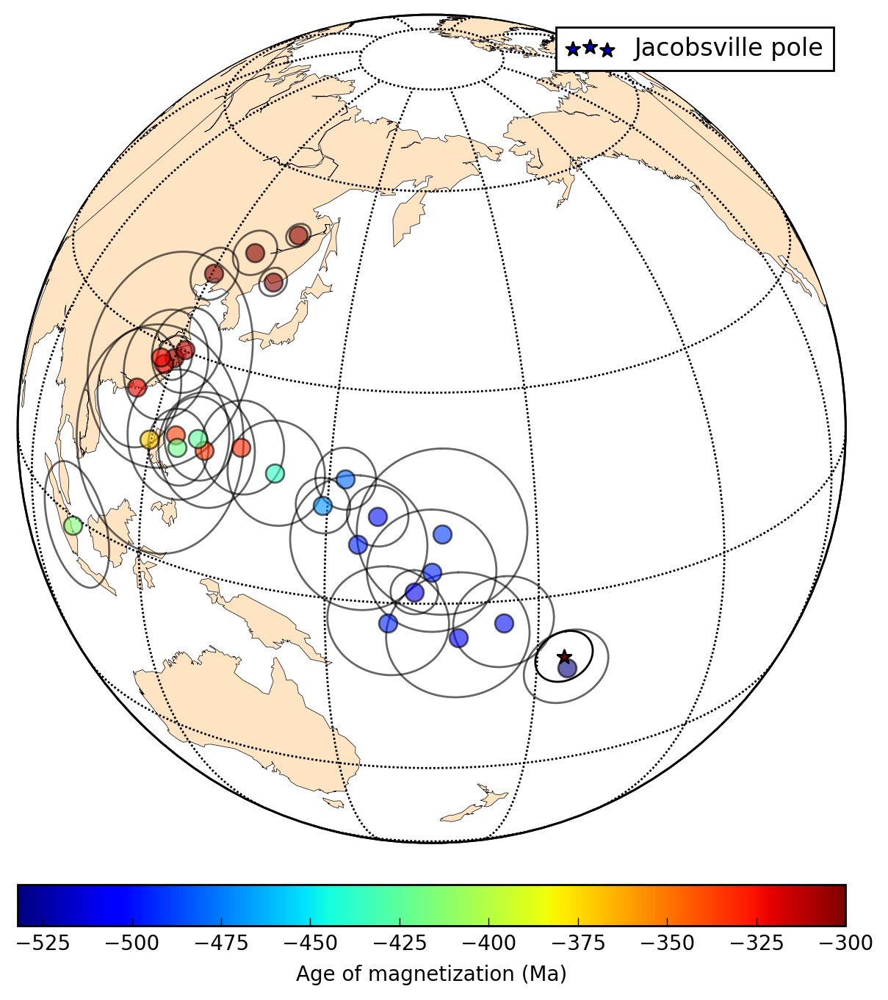

In [73]:
Laurentia_Phanerozoic_poles = pd.read_csv('../Data/Reconstruction/Laurentia_Pole_Compilation.csv')

plt.figure(figsize=(8, 8))
pmap = Basemap(projection='ortho',lat_0=25,lon_0=165,
               resolution='c',area_thresh=50000)
pmap.drawcoastlines(linewidth=0.25)
pmap.fillcontinents(color='bisque',lake_color='white',zorder=1)
pmap.drawmapboundary(fill_color='white')
pmap.drawmeridians(np.arange(0,360,30))
pmap.drawparallels(np.arange(-90,90,30))


# centerlon, centerlat = pmap(combined_poles['PLon_rot'].tolist(),combined_poles['PLat_rot'].tolist())
# for n in range(len(combined_poles)):
#     ipmag.plot_pole(m, combined_poles['PLon_rot'][n],
#                          combined_poles['PLat_rot'][n], 
#                          combined_poles['A95'][n])

for n in xrange (0, len(Laurentia_Phanerozoic_poles)):
     m = ipmag.plot_pole_colorbar(pmap, Laurentia_Phanerozoic_poles['CLon'][n] - 180,
                                  -Laurentia_Phanerozoic_poles['CLat'][n],
                                  Laurentia_Phanerozoic_poles['A95'][n],
                                  -Laurentia_Phanerozoic_poles['Age'][n],
                                  -532,
                                  -300,
                                  markersize=80, color="k", alpha=0.6)
        
m = ipmag.plot_pole_colorbar(pmap, 184, -10, 4.2, 532, -532, -300, marker='*', markersize=50, 
                             color="k", alpha=1, label='Jacobsville pole')

pmap.colorbar(m,location='bottom',pad="5%",label='Age of magnetization (Ma)')
#ipmag.plot_pole(pmap, 184, -10, 4.2, marker='*', color='r', markersize=30.0, label='Jacobsville pole')
plt.legend()
plt.savefig('Code_output/PhanerozoicAPWP_Jacobsville.pdf')
plt.show()

## Map of late stage volcanics paleomagnetic sites

The following is an overview map of all paleomagnetic sites used in the preceding analysis.

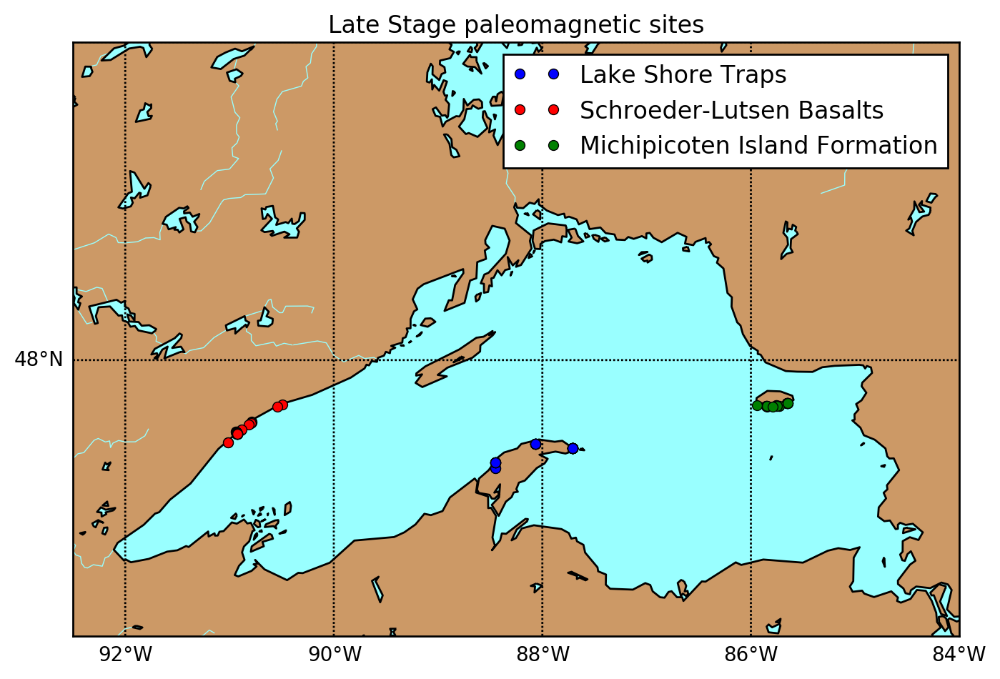

In [71]:
fig = plt.figure(figsize=(8,8))
m = Basemap(projection='merc',llcrnrlat=46.2,urcrnrlat=50,llcrnrlon=-92.5,
            urcrnrlon=-84,resolution='i',area_thresh = 0.1) #lat_ts=-25
m.drawrivers(color='#99ffff')
m.drawcoastlines()
#m.drawcountries(linewidth=1.5)
m.drawmapboundary(fill_color='#99ffff')
m.fillcontinents(color='#cc9966',lake_color='#99ffff')
parallels = np.arange(-90,90,2.)
m.drawparallels(parallels,labels=[1,0,0,0],fontsize=10)
meridians = np.arange(0.,360.,2.)
m.drawmeridians(meridians,labels=[0,0,0,1],fontsize=10)
plt.title('Late Stage paleomagnetic sites')

LST_site_lon=[]
LST_site_lat=[]
for n in range(0,len(Kulakov2013a_LST_Data)):
    LST_site_lon.append(Kulakov2013a_LST_Data['site_lon'][n])          
    LST_site_lat.append(Kulakov2013a_LST_Data['site_lat'][n])  
for n in range(0,len(Diehl1994a_LST_Data_all)):
    LST_site_lon.append(Diehl1994a_LST_Data_all['site_lon'][n])          
    LST_site_lat.append(Diehl1994a_LST_Data_all['site_lat'][n])
    
LST_x,LST_y = m(LST_site_lon,LST_site_lat)
m.plot(LST_x, LST_y, 'bo', markersize=5, 
       label='Lake Shore Traps')

SLB_x,SLB_y = m(NSVG_nsl['site_lon'].tolist()+SLB_Data['average_lon'].tolist(),
                NSVG_nsl['site_lat'].tolist()+SLB_Data['average_lat'].tolist())
m.plot(SLB_x, SLB_y, 'ro', markersize=5, 
       label='Schroeder-Lutsen Basalts')

MI_x,MI_y = m(SS_final_tc['average_lon'].tolist()+Palmer_data_trimmed['site_lon'].tolist(),
              SS_final_tc['average_lat'].tolist()+Palmer_data_trimmed['site_lat'].tolist())
m.plot(MI_x, MI_y, 'go', markersize=5, 
       label='Michipicoten Island Formation')
plt.legend()
plt.show()

## References

Books, K., 1968, Magnetization of the lowermost Keweenawan lava flows in the Lake Superior area, Geological Survey research 1968, chapter D: U.S. Geological Survey Professional Paper, vol. P 0600-D, pp. 248–254.

Books, K., 1972, Paleomagnetism of some Lake Superior Keweenawan rocks: U.S. Geological Survey Professional Paper, vol. P 0760, p. 42.

Davis, D. and Green, J., 1997, Geochronology of the North American Midcontinent rift in western Lake Superior and implications for its geodynamic evolution: Canadian Journal of Earth Science, vol. 34, pp. 476–488, doi: 10.1139/e17-039.

Diehl, J. and Haig, T., 1994, A paleomagnetic study of the lava flows within the Copper Harbour Conglomerate, Michigan: New results and implications: Canadian Journal of Earth Sciences, vol. 31, pp. 369–380, doi:10.1139/ e94-034.

Evans, D., 2009, The palaeomagnetically viable, long-lived and all-inclusive Rodinia supercontinent reconstruction: In Murphy, J., Keppie, J., and Hynes, A., eds., Ancient Orogens and Modern Analogues, Geological Society of London Special Publication, vol. 327, pp. 371–404, doi:10.1144/sp327.16.

Fisher, N. I., Lewis, T., and Embleton, B. J. J., 1987, Statistical Analysis of Spherical Data: Cambridge University Press, doi:10.1017/CBO9780511623059.

Kulakov, E. V., Smirnov, A. V., and Diehl, J. F., 2013, Paleomagnetism of ∼1.09 Ga Lake Shore Traps (Keweenaw Peninsula, Michigan): new results and implications: Canadian Journal of Earth Sciences, vol. 50, pp. 1085–1096, doi:10.1139/cjes-2013-0003.

Li, Z. X. et al., 2008, Assembly, configuration, and break-up history of Rodinia: A synthesis: Precambrian Research, vol. 160, pp. 179–210, doi:10.1016/j.precamres.2007.04.021.

Malone, D. H., Stein, C. A., Craddock, J. P., Kley, J., Stein, S., and Malone, J. E., 2015, Maximum depositional age of the Neoproterozoic Jacobsville Sandstone, Michigan: Implications for the evolution of the Midcontinent Rift: URL http://www.earth.northwestern.edu/people/seth/Texts/mcrfail.pdf.

McFadden, P. and McElhinny, M., 1990, Classification of the reversal test in palaeomagnetism: Geophysical Journal International, vol. 103, pp. 725–729.

Palmer, H., 1970, Paleomagnetism and correlation of some Middle Keweenawan rocks, Lake Superior: Canadian Journal of Earth Science, vol. 7, pp. 1410–1436, doi:10.1139/e70-136.

Palmer, H. and Davis, D., 1987, Paleomagnetism and U-Pb geochronology of volcanic rocks from Michipicoten Island, Lake Superior, Canada: precise calibration of the Keweenawan polar wander track: Precambrian Research, vol. 37, pp. 157–171, doi:10.1016/0301-9268(87)90077-5.

Pisarevsky, S., Wingate, T., Powell, C. M., Johnson, S., and Evans, D., 2003, Models of Rodinia assembly and fragmentation: In Yoshida, M., Windley, B., and Dasgupta, S., eds., Proterozoic East Gondwana: Supercontinent Assembly and Breakup, The Geological Society of London Special Publications, vol. 206, pp. 35–55, doi:10.1144/ gsl.sp.2003.206.01.04.

Symons, D. T. A., Kawasaki, K., and Diehl, J. F., 2013, Age and genesis of the White Pine stratiform copper mineralization, northern Michigan, USA, from paleomagnetism: Geofluids, vol. 13, pp. 112–126, doi:10.1111/gfl.12024.

Tauxe, L. and Kodama, K., 2009, Paleosecular variation models for ancient times: Clues from Keweenawan lava flows: Physics of the Earth and Planetary Interiors, vol. 177, pp. 31–45, doi:10.1016/j.pepi.2009.07.006.

Tauxe, L., Shaar, R., Jonestrask, L., Swanson-Hysell, N., Minnett, R., Koppers, A., Constable, C., Jarboe, N., Gaastra, K., and Fairchild, L., 2016, PmagPy: Software package for paleomagnetic data analysis and a bridge to the Magnetics Information Consortium (MagIC) Database: Geochemistry, Geophysics, Geosystems, doi:10.1002/ 2016GC006307.

Watson, G., 1956, A test for randomness of directions: Geophysical Journal International, vol. 7, pp. 160–161, doi:10.1111/j.1365-246X.1956.tb05561.x.